loading packages

In [12]:
import pandas as pd
import geopandas as gpd

# drawing
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Patch

from scipy.stats import f_oneway
import os
import seaborn as sns
import numpy as np
import seaborn as sns

from libpysal.weights.util import full2W
from esda.moran import Moran
from libpysal.weights import DistanceBand
from esda.moran import Moran
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import libpysal

# read clutering

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import KFold
from sklearn.metrics import pairwise_distances
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score


import contextily as ctx
import re
from scipy.spatial.distance import cdist


import random

1.  cluster analysis

In [2]:
df = pd.read_csv('data/output_results/final_quarter.csv')
quarter_map = pd.read_csv("data/card_22/quarter_index.csv")
quarter_map = dict(zip(quarter_map['quarter'], quarter_map['index']))
stations = gpd.read_file('data/stations_tfl.geojson')
lines = gpd.read_file('data/tfl_lines.json')

In [3]:
metadata_cols = ['ASC',"Station",'Fare Zone']

排除异常值找异常值（都是0）

In [4]:
entry_exit_cols = [col for col in df.columns if '_entries' in col or '_exits' in col]
total_flow = df[entry_exit_cols].sum(axis=1)

# 过滤出总和为 0 的站点
zero_flow_mask = (total_flow == 0)
zero_flow_stations = df.loc[zero_flow_mask, ['NLC', 'ASC', 'Station']]

# 查看结果
print(f" no flows stations:{len(zero_flow_stations)}")
display(zero_flow_stations.head(10))

 no flows stations:39


,NLC,ASC,Station
4,9441,ADVt,Addington Village
5,9440,ADSt,Addiscombe
11,9442,AMPt,Ampere Way
15,9443,ARNt,Arena
18,9444,AVRt,Avenue Road
29,9445,BCJt,Beckenham Junction Trams
30,9446,BCRt,Beckenham Road
34,9449,BDLt,Beddington Lane
35,9450,BGWt,Belgrave Walk
40,9454,BKBt,Birkbeck Trams


In [5]:
# 检查会不会有特殊天
def check_zero_day(df, day, direction='entries'):
    # 获取该天所有列名（如 '0600-0615_fri_entries'）
    target_cols = [col for col in df.columns if f"_{day}_{direction}" in col]
    
    # 对这些列求和（按行，代表一个站点的一天）
    row_sums = df[target_cols].sum(axis=1)
    
    # 统计为 0 的站点数
    zero_count = (row_sums == 0).sum()
    
    print(f"{day.capitalize()} ({direction}): {zero_count} stations have all-zero values")

days = ['mon', 'twt', 'fri', 'sat', 'sun']

for day in days:
    check_zero_day(df, day=day, direction='entries')
    check_zero_day(df, day=day, direction='exits')

Mon (entries): 39 stations have all-zero values
Mon (exits): 39 stations have all-zero values
Twt (entries): 39 stations have all-zero values
Twt (exits): 39 stations have all-zero values
Fri (entries): 39 stations have all-zero values
Fri (exits): 39 stations have all-zero values
Sat (entries): 39 stations have all-zero values
Sat (exits): 39 stations have all-zero values
Sun (entries): 39 stations have all-zero values
Sun (exits): 39 stations have all-zero values


In [6]:
# 只保留总流量 > 0 的站点
nonzero_mask = df[entry_exit_cols].sum(axis=1) > 0
analyse_df = df[nonzero_mask].reset_index(drop=True)
analyse_df.shape

(432, 964)

mean day travel pattern

In [40]:
valid_cols = [col for col in df.columns if len(col.split('_')) == 3]
weekday_labels = ['mon', 'twt', 'fri', 'sat', 'sun']
time_bins = sorted(set(col.split('_')[0] for col in valid_cols))

# Step 2：按 weekday 构建进出流量曲线
def extract_flows(flow_type='entries'):
    weekday_flows = {}
    for wd in weekday_labels:
        wd_cols = [col for col in df.columns if f"_{wd}_{flow_type}" in col]
        time_labels = [col.split('_')[0] for col in wd_cols]
        time_col_map = dict(zip(time_labels, wd_cols))
        sorted_times = sorted(time_col_map.keys())
        sorted_cols = [time_col_map[t] for t in sorted_times]
        flow = df[sorted_cols].mean(axis=0).values
        weekday_flows[wd] = (sorted_times, flow)
    return weekday_flows

entries_flows = extract_flows('entries')
exits_flows = extract_flows('exits')

In [52]:
def plot_combined_filled_lines(entries_flows, exits_flows):
    colors = plt.cm.Set3.colors
    font_size = 18  # 统一字体大小

    fig, axes = plt.subplots(2, 1, figsize=(16, 10), sharex=True)

    for ax, weekday_flows, title, ylabel in zip(
        axes,
        [entries_flows, exits_flows],
        ["Filled Line Chart of Total Entries by Day", "Filled Line Chart of Total Exits by Day"],
        ["Entries", "Exits"]
    ):
        for i, (wd, (x, y)) in enumerate(weekday_flows.items()):
            ax.plot(x, y, color=colors[i], label=wd.capitalize())
            ax.fill_between(x, y, color=colors[i], alpha=0.35)

        ax.set_title(title, fontsize=font_size)
        ax.set_ylabel(ylabel, fontsize=font_size)
        ax.tick_params(axis='both', labelsize=font_size)

    # 设置图例，只在第一个子图中显示
    legend_patches = [
        Patch(facecolor=colors[i], label=wd.capitalize())
        for i, wd in enumerate(entries_flows.keys())
    ]
    axes[0].legend(
        handles=legend_patches,
        loc='upper center',
        bbox_to_anchor=(0.5, 1.02),  # 可微调高度
        ncol=len(entries_flows),     # 每列一个 label，横向排布
        fontsize=font_size,
        frameon=False                # 可选：去边框更简洁
    )

    # 设置共享的 x 轴标签
    axes[1].set_xlabel("Time Interval", fontsize=font_size)

    # 计算 X 轴刻度：每两个小时一个
    all_labels = entries_flows[next(iter(entries_flows))][0]
    tick_positions = [i for i, t in enumerate(all_labels) if re.match(r'\d{2}00-\d{2}1[5]', t)]
    
    # 每两个小时留一个 tick（索引间隔 8 小时）
    tick_positions = tick_positions[::2]
    def to_hour_label(t):
        hour = int(t[:2])
        return f"{hour:02d}:00"

    tick_labels = [to_hour_label(all_labels[i]) for i in tick_positions]
    tick_positions.append(len(all_labels))      # 添加到末尾（超出最后索引）
    tick_labels.append("24:00") 

    axes[1].set_xticks(tick_positions)
    axes[1].set_xticklabels(tick_labels, rotation=0, fontsize=font_size)

    plt.tight_layout()
    plt.show()

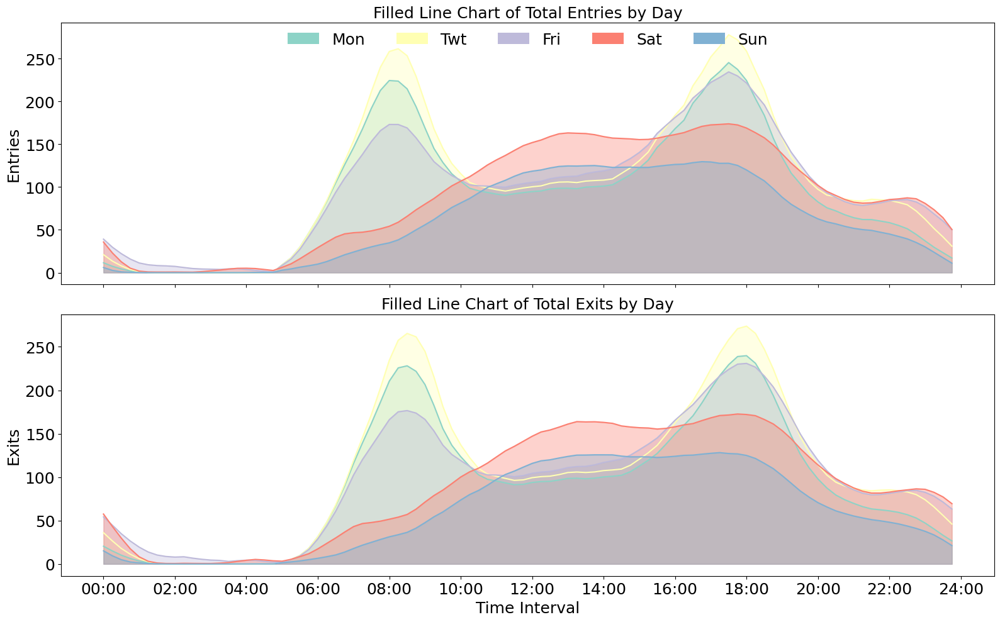

In [53]:
plot_combined_filled_lines(entries_flows, exits_flows)

理解 weekday 模式差异，选择哪些时间段作为聚类特征

In [54]:
nonzero_ratio = (df != 0).sum(axis=0) / len(df)
mostly_zero_columns = nonzero_ratio[nonzero_ratio < 0.05]

In [55]:
mostly_zero_df = pd.DataFrame({
    'column': mostly_zero_columns.index,
    'nonzero_ratio': mostly_zero_columns.values
}).sort_values(by='nonzero_ratio')

# 拆解列名成时间段、星期、方向
mostly_zero_df[['time', 'day', 'direction']] = mostly_zero_df['column'].str.extract(r'([0-9]{4}-[0-9]{4})_([a-z]+)_(entries|exits)')

# 重排序
mostly_zero_df = mostly_zero_df[['time', 'day', 'direction', 'nonzero_ratio']].sort_values(by='nonzero_ratio')

print(" 大多数站点为 0 的时间段明细：")
display(mostly_zero_df.head())
print(mostly_zero_df.shape)

 大多数站点为 0 的时间段明细：


,time,day,direction,nonzero_ratio
30,0230-0245,sun,exits,0.002123
29,0215-0230,sun,exits,0.004246
24,0200-0215,sun,entries,0.004246
25,0215-0230,sun,entries,0.006369
50,0345-0400,twt,exits,0.008493


(55, 4)


In [56]:
weekday_entry_cols = []
weekday_exit_cols = []
def filter_after_5am(cols):
    result = []
    for col in cols:
        match = re.match(r'(\d{4})-\d{4}_\w+_(entries|exits)', col)
        if match:
            hour = int(match.group(1)[:2])
            if hour >= 5:
                result.append(col)
    return result

In [57]:
for day in days:
    # 提取该天的 entries/exits 列
    day_entry_cols = [col for col in df.columns if f"_{day}_" in col and col.endswith("_entries")]
    day_exit_cols  = [col for col in df.columns if f"_{day}_" in col and col.endswith("_exits")]

    day_entry_cols = filter_after_5am(day_entry_cols)
    day_exit_cols  = filter_after_5am(day_exit_cols)

    weekday_entry_cols.append(day_entry_cols)
    weekday_exit_cols.append(day_exit_cols)

In [58]:
len(weekday_entry_cols[0])

76

### 2.  特征构建与标准化(函数定义)
#### 2.1 站点内部标准化（行为模式）

In [59]:
def compute_normalized_ratio_matrix(df_raw, flow_cols):
    """
    按站点总流量归一化某一组 flow 列（如一整天的 entries/exits）

    参数：
        df_raw: 原始 DataFrame（含 metadata 和流量列）
        flow_cols: 要归一化的列名列表（例如某天所有 entries）

    返回：
        ratio_matrix: 标准化后的行为比例矩阵（DataFrame，station × time）
    """
    df_flow = df_raw[flow_cols].copy()
    df_flow.index = df_raw["NLC"]  # 将站点设为 index（和 pseudo 一致）

    T_it = df_flow
    T_i_dot = T_it.sum(axis=1).replace(0, 1)  # 每个站点的总量（避免除 0）

    # 比例归一化：每行除以该站的总量
    ratio_matrix = T_it.div(T_i_dot, axis=0)

    return ratio_matrix

In [60]:
def compute_pseudo_location_quotient(df_raw, flow_cols):
    """
    para:
        df_raw: 原始 DataFrame (包含 metadata)
        flow_cols: 所有表示某类流量 (entries 或 exits) 的列名
    return:
        伪位置商矩阵 rho_it DataFrame[station × time]
    """
    df_flow = df_raw[flow_cols].copy()
    df_flow.index = df_raw["NLC"]  # 将站点名作为 index
    
    T_it = df_flow
    T_i_dot = T_it.sum(axis=1)       # 每个站点的总流量
    T_dot_t = T_it.sum(axis=0)       # 每个时间段的总流量
    T_dot_dot = T_dot_t.sum()        # 整个系统的总流量

    # ρ_it = T_it * T_total / (T_i. * T_.t)
    rho = (T_it.multiply(T_dot_dot)).div(T_i_dot, axis=0).div(T_dot_t, axis=1)

    return rho

In [61]:
# 计算伪位置熵
ratio_entry_list = []
ratio_exit_list = []
rho_entry_list = []
rho_exit_list = []

In [62]:
for i in range(len(days)):
    entry_cols = weekday_entry_cols[i]
    exit_cols  = weekday_exit_cols[i]

    # 计算 pseudo location quotient
    rho_entry_day = compute_pseudo_location_quotient(analyse_df, entry_cols)
    rho_exit_day  = compute_pseudo_location_quotient(analyse_df, exit_cols)
    ratio_entry_day = compute_normalized_ratio_matrix(analyse_df, entry_cols)
    ratio_exit_day = compute_normalized_ratio_matrix(analyse_df, exit_cols)

    rho_entry_norm = pd.DataFrame(
         MinMaxScaler().fit_transform(rho_entry_day),
         index=rho_entry_day.index,
         columns = rho_entry_day.columns
     )
    rho_exit_norm = pd.DataFrame(
         MinMaxScaler().fit_transform(rho_exit_day),
         index=rho_exit_day.index,
         columns = rho_exit_day.columns
     )
    
    # 加入列表
    ratio_entry_list.append(ratio_entry_day)
    ratio_exit_list.append(ratio_exit_day)
    rho_entry_list.append(rho_entry_norm)
    rho_exit_list.append(rho_exit_norm)
    
        # 标准化（0–1）伪位置商还是标准化了

In [63]:
X_ratio = pd.concat(ratio_entry_list + ratio_exit_list, axis=1)
X_rho   = pd.concat(rho_entry_list + rho_exit_list, axis=1)

In [64]:
df_metadata = analyse_df.set_index('NLC').loc[X_ratio.index, metadata_cols]
df_ratio_with_meta = pd.concat([df_metadata, X_ratio], axis=1)
print(" 合并后形状：", df_ratio_with_meta.shape)
display(df_ratio_with_meta.head())
# 输出为 CSV 文件
df_ratio_with_meta.to_csv("nom_ratio.csv", index=True)

 合并后形状： (432, 763)


,ASC,Station,Fare Zone,0500-0515_mon_entries,0515-0530_mon_entries,0530-0545_mon_entries,0545-0600_mon_entries,0600-0615_mon_entries,0615-0630_mon_entries,0630-0645_mon_entries,...,2130-2145_sun_exits,2145-2200_sun_exits,2200-2215_sun_exits,2215-2230_sun_exits,2230-2245_sun_exits,2245-2300_sun_exits,2300-2315_sun_exits,2315-2330_sun_exits,2330-2345_sun_exits,2345-0000_sun_exits
NLC,,,,,,,,,,,,,,,,,,,,,
750,ABRd,Abbey Road,2/3,0.001991,0.003962,0.006132,0.009416,0.012720,0.015365,0.018334,...,0.013257,0.013202,0.012844,0.012403,0.012835,0.013477,0.014156,0.011725,0.009651,0.006798
1404,ACCr,Acton Central,3,0.000000,0.000000,0.001660,0.003983,0.007881,0.011627,0.017679,...,0.009772,0.009328,0.008493,0.009439,0.009860,0.010038,0.008397,0.006941,0.004302,0.001870
3000,AMLr,Acton Main Line,3,0.000918,0.001148,0.003160,0.005481,0.008587,0.011900,0.016064,...,0.017754,0.017299,0.018523,0.016664,0.013708,0.009564,0.006159,0.001060,0.000000,0.000000
500,ACTu,Acton Town,3,0.001555,0.002562,0.004154,0.006228,0.007868,0.010495,0.013783,...,0.013535,0.013880,0.013893,0.012901,0.011827,0.011574,0.010999,0.010238,0.009296,0.008104
502,ALDu,Aldgate,1,0.000641,0.000775,0.001375,0.002004,0.003023,0.004181,0.005791,...,0.013278,0.013358,0.013009,0.012175,0.011356,0.010523,0.009200,0.007781,0.007000,0.005018


In [65]:
df_rho_with_meta = pd.concat([df_metadata, X_rho], axis=1)
df_rho_with_meta.to_csv("nom_rho.csv", index=True)

In [66]:
# 检查索引是否一致
print("站点是否对齐：", (X_ratio.index == X_rho.index).all())

# 查看维度
print("X_ratio shape:", X_ratio.shape)
print("X_rho shape:", X_rho.shape)

站点是否对齐： True
X_ratio shape: (432, 760)
X_rho shape: (432, 760)


这里选择两天的变量就是周中周末的来找出行特点

In [67]:
twt_entry_ratio = ratio_entry_list[1]
sat_entry_ratio = ratio_entry_list[3]
twt_exit_ratio  = ratio_exit_list[1]
sat_exit_ratio  = ratio_exit_list[3]

In [68]:
twt_entry_rho = rho_entry_list[1]
sat_entry_rho = rho_entry_list[3]
twt_exit_rho  = rho_exit_list[1]
sat_exit_rho  = rho_exit_list[3]

In [69]:
X_ratio_sec = pd.concat([twt_entry_ratio, sat_entry_ratio, twt_exit_ratio, sat_exit_ratio], axis=1)
print(X_ratio_sec)

      0500-0515_twt_entries  0515-0530_twt_entries  0530-0545_twt_entries  \
NLC                                                                         
750                0.002025               0.003494               0.005281   
1404               0.000000               0.000000               0.001885   
3000               0.001170               0.001422               0.003311   
500                0.001316               0.002449               0.004166   
502                0.000429               0.000508               0.000981   
...                     ...                    ...                    ...   
6560               0.000208               0.000478               0.000839   
5131               0.002488               0.005476               0.009503   
6561               0.000761               0.001897               0.003534   
6562               0.002352               0.003900               0.006415   
9846               0.001248               0.002218               0.002406   

In [70]:
X_rho_sec = pd.concat([twt_entry_rho, sat_entry_rho, twt_exit_rho, sat_exit_rho], axis=1)

In [71]:
X_rho_sec

,0500-0515_twt_entries,0515-0530_twt_entries,0530-0545_twt_entries,0545-0600_twt_entries,0600-0615_twt_entries,0615-0630_twt_entries,0630-0645_twt_entries,0645-0700_twt_entries,0700-0715_twt_entries,0715-0730_twt_entries,...,2130-2145_sat_exits,2145-2200_sat_exits,2200-2215_sat_exits,2215-2230_sat_exits,2230-2245_sat_exits,2245-2300_sat_exits,2300-2315_sat_exits,2315-2330_sat_exits,2330-2345_sat_exits,2345-0000_sat_exits
NLC,,,,,,,,,,,,,,,,,,,,,
750,0.248025,0.141880,0.192714,0.249166,0.288015,0.267902,0.352423,0.419849,0.443753,0.290976,...,0.561690,0.553468,0.494067,0.512580,0.473860,0.470923,0.367136,0.443485,0.382302,0.343320
1404,0.000000,0.000000,0.066671,0.120067,0.187471,0.217664,0.327328,0.440402,0.562655,0.373197,...,0.497451,0.469104,0.442567,0.446088,0.397632,0.351212,0.283106,0.353785,0.347026,0.279099
3000,0.143362,0.057725,0.119584,0.154581,0.182005,0.186805,0.265637,0.362482,0.437918,0.321782,...,0.652787,0.681596,0.813643,0.919029,0.886048,0.973928,0.830267,0.801419,0.615192,0.499862
500,0.161224,0.099448,0.151341,0.177964,0.183755,0.188612,0.243310,0.310504,0.371402,0.282090,...,0.603658,0.588957,0.541426,0.603619,0.578260,0.531745,0.423520,0.471627,0.463649,0.459089
502,0.052504,0.020638,0.033115,0.040891,0.055707,0.061753,0.088039,0.115743,0.136137,0.090439,...,0.498370,0.480360,0.453389,0.499859,0.475078,0.434575,0.352476,0.405285,0.350924,0.315599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6560,0.025494,0.019415,0.027819,0.039288,0.050880,0.051910,0.069464,0.098344,0.123808,0.092726,...,0.518047,0.499161,0.479538,0.467376,0.416959,0.363095,0.280437,0.248017,0.225058,0.164641
5131,0.304735,0.222354,0.349422,0.476156,0.566850,0.568592,0.686441,0.813283,0.827013,0.524028,...,0.697637,0.711700,0.614835,0.688308,0.579398,0.570255,0.405534,0.515557,0.397274,0.376347
6561,0.093193,0.077031,0.127854,0.186984,0.235737,0.243052,0.315412,0.385625,0.408958,0.261685,...,0.481723,0.496330,0.452391,0.510266,0.428314,0.409402,0.291872,0.351599,0.254110,0.225695


In [72]:
# 是否完全相同
print((X_rho.index == X_rho_sec.index).all())
X_rho_sec.to_csv("X_rho_sec.csv", index=True)

True


In [73]:
# 对 X_ratio 做 PCA
pca_ratio = PCA(n_components=20)
X_pca_ratio = pca_ratio.fit_transform(X_ratio_sec)
# 每个主成分的解释比例和累计比例
explained_var = pd.DataFrame({
    'Principal Component': [f'PC{i+1}' for i in range(len(pca_ratio.explained_variance_ratio_))],
    'Explained Variance Ratio': pca_ratio.explained_variance_ratio_,
    'Cumulative Explained Variance': pca_ratio.explained_variance_ratio_.cumsum()
})

print(explained_var.head(10))  # 显示前10个主成分的解释能力

  Principal Component  Explained Variance Ratio  Cumulative Explained Variance
0                 PC1                  0.576093                       0.576093
1                 PC2                  0.083845                       0.659939
2                 PC3                  0.065040                       0.724979
3                 PC4                  0.042032                       0.767011
4                 PC5                  0.035797                       0.802808
5                 PC6                  0.027150                       0.829958
6                 PC7                  0.021132                       0.851090
7                 PC8                  0.014483                       0.865573
8                 PC9                  0.013515                       0.879088
9                PC10                  0.012091                       0.891179


In [74]:
pca_rho = PCA(n_components=20)
X_pca_rho = pca_rho.fit_transform(X_rho_sec)
# 每个主成分的解释比例和累计比例
explained_var = pd.DataFrame({
    'Principal Component': [f'PC{i+1}' for i in range(len(pca_rho.explained_variance_ratio_))],
    'Explained Variance Ratio': pca_rho.explained_variance_ratio_,
    'Cumulative Explained Variance': pca_rho.explained_variance_ratio_.cumsum()
})

print(explained_var.head(10))  # 显示前10个主成分的解释能力

  Principal Component  Explained Variance Ratio  Cumulative Explained Variance
0                 PC1                  0.502160                       0.502160
1                 PC2                  0.082068                       0.584228
2                 PC3                  0.068043                       0.652271
3                 PC4                  0.056581                       0.708852
4                 PC5                  0.047184                       0.756036
5                 PC6                  0.028627                       0.784662
6                 PC7                  0.018880                       0.803542
7                 PC8                  0.018036                       0.821578
8                 PC9                  0.017012                       0.838590
9                PC10                  0.013555                       0.852145


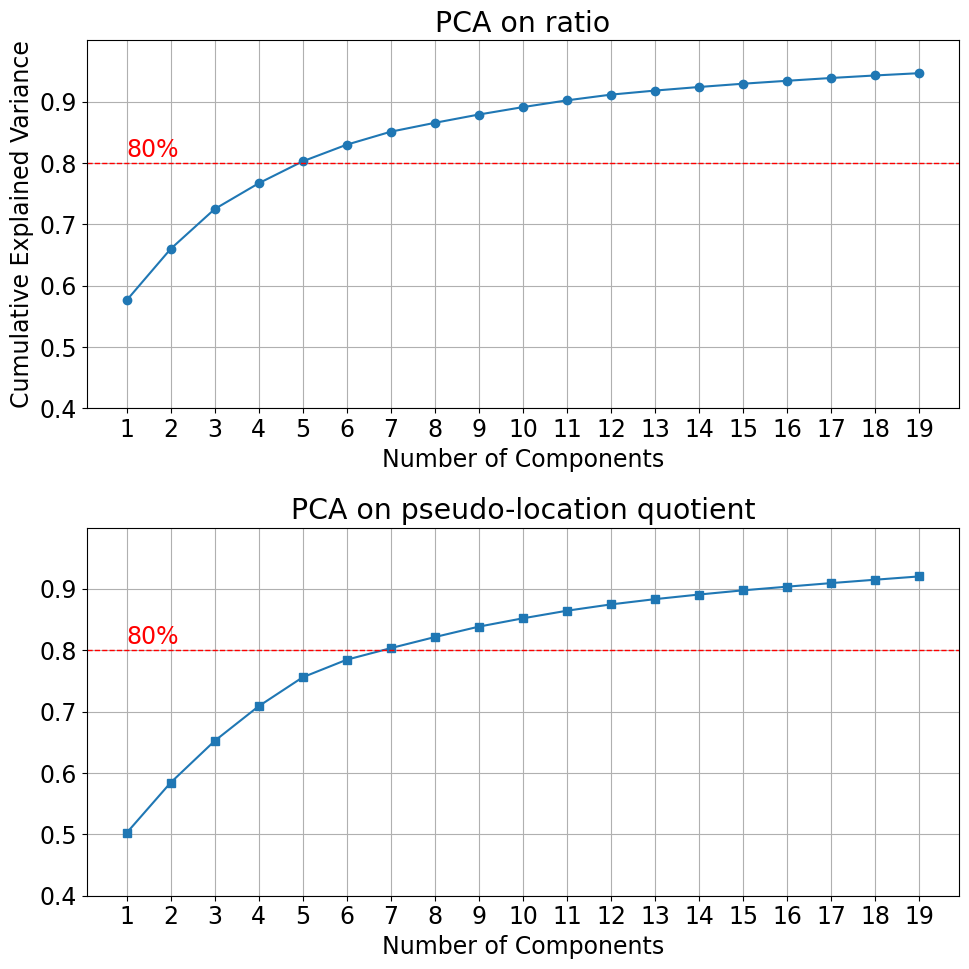

In [81]:
import matplotlib.pyplot as plt

plt.rcParams.update({'font.size': 17})  # 全局字体大小

fig, axes = plt.subplots(2, 1, figsize=(10, 10), sharey=True)

# x 轴刻度范围
x_ticks = range(1, 20)
y_ticks = np.arange(0.4, 1.0, 0.1)

# 上图：pca_ratio
axes[0].plot(
    x_ticks,
    pca_ratio.explained_variance_ratio_.cumsum()[:19],
    marker='o'
)
axes[0].set_title("PCA on ratio")
axes[0].set_xlabel("Number of Components")
axes[0].set_ylabel("Cumulative Explained Variance")
axes[0].set_xticks(x_ticks)
axes[0].set_yticks(y_ticks)
axes[0].grid(True)
axes[0].axhline(y=0.80, color='red', linestyle='--', linewidth=1)
axes[0].text(1, 0.81, '80%', color='red', fontsize=17)
axes[0].set_ylim(0.45, 1.0)

# 下图：pca_rho
axes[1].plot(
    x_ticks,
    pca_rho.explained_variance_ratio_.cumsum()[:19],
    marker='s'
)
axes[1].set_title("PCA on pseudo-location quotient")
axes[1].set_xlabel("Number of Components")
axes[1].set_xticks(x_ticks)
axes[1].set_yticks(y_ticks)
axes[1].grid(True)
axes[1].axhline(y=0.80, color='red', linestyle='--', linewidth=1)
axes[1].text(1, 0.81, '80%', color='red', fontsize=17)

plt.tight_layout()
plt.show()



In [82]:
list_var_ratio = X_ratio_sec.columns

# 生成载荷矩阵
loading_ratio = pd.DataFrame(
    pca_ratio.components_.T,
    index=list_var_ratio,
    columns=[f'PC{i+1}' for i in range(pca_ratio.n_components)]
)

list_var_rho = X_rho_sec.columns

# 生成载荷矩阵
loading_rho = pd.DataFrame(
    pca_rho.components_.T,
    index=list_var_rho,
    columns=[f'PC{i+1}' for i in range(pca_rho.n_components)]
)


In [83]:
# 查看 ratio PCA 的前 10 个主成分中 loading 最大的变量
for pc in loading_ratio.columns[:10]:
    print(f"\nTop variables for {pc} (ratio):")
    print(loading_ratio[pc].abs().sort_values(ascending=False).head(10))



Top variables for PC1 (ratio):
0745-0800_twt_entries    0.208100
0730-0745_twt_entries    0.203770
0800-0815_twt_entries    0.196926
0715-0730_twt_entries    0.187870
0815-0830_twt_entries    0.178714
0700-0715_twt_entries    0.162648
0830-0845_twt_entries    0.146816
0645-0700_twt_entries    0.146423
0900-0915_twt_exits      0.138767
0845-0900_twt_exits      0.135857
Name: PC1, dtype: float64

Top variables for PC2 (ratio):
0815-0830_twt_exits      0.267520
0800-0815_twt_exits      0.261857
0830-0845_twt_exits      0.255645
0745-0800_twt_exits      0.219375
0845-0900_twt_exits      0.213362
0730-0745_twt_exits      0.165742
0900-0915_twt_exits      0.158107
0730-0745_twt_entries    0.139513
0715-0730_twt_entries    0.135790
2200-2215_twt_entries    0.124357
Name: PC2, dtype: float64

Top variables for PC3 (ratio):
0630-0645_twt_entries    0.206543
0845-0900_twt_entries    0.206447
0615-0630_twt_entries    0.203998
0645-0700_twt_entries    0.202784
0830-0845_twt_entries    0.195658
09

In [84]:
# 查看 rho PCA 的前 10 个主成分中 loading 最大的变量
for pc in loading_rho.columns[:10]:
    print(f"\nTop variables for {pc} (rho):")
    print(loading_rho[pc].abs().sort_values(ascending=False).head(10))


Top variables for PC1 (rho):
0700-0715_twt_entries    0.108763
0800-0815_twt_entries    0.104324
1900-1915_twt_entries    0.101653
0645-0700_twt_entries    0.100068
1845-1900_twt_entries    0.098428
1800-1815_twt_exits      0.098345
0815-0830_twt_entries    0.096472
2000-2015_twt_entries    0.095051
0830-0845_twt_entries    0.094572
1015-1030_twt_exits      0.093918
Name: PC1, dtype: float64

Top variables for PC2 (rho):
0815-0830_sat_exits    0.181845
0830-0845_sat_exits    0.169346
0845-0900_sat_exits    0.165045
0800-0815_sat_exits    0.160741
0745-0800_sat_exits    0.158084
0730-0745_sat_exits    0.143105
0900-0915_sat_exits    0.143094
0715-0730_sat_exits    0.127100
0915-0930_sat_exits    0.126912
2215-2230_twt_exits    0.118746
Name: PC2, dtype: float64

Top variables for PC3 (rho):
1730-1745_twt_exits      0.129165
1800-1815_twt_exits      0.123756
1745-1800_twt_exits      0.121553
1715-1730_twt_exits      0.121018
1315-1330_sat_exits      0.116475
0815-0830_twt_exits      0.1

In [85]:
# 设置主成分数量和每个主成分下要提取的变量数，封闭性
top_n = 10
top_k = 15  # 提取 PC1–PC10

# 提取每个主成分中 loading 最大的变量名
top_vars_dict = {}
for pc in loading_ratio.columns[:top_k]:
    top_vars_dict[pc] = loading_ratio[pc].abs().sort_values(ascending=False).head(top_n).index.tolist()

# 转置为并列表格：每列是 PC1, PC2, ..., 每行是第 i 大变量名
top_vars_df = pd.DataFrame(top_vars_dict)

# 显示结果
from IPython.display import display
display(top_vars_df)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
0,0745-0800_twt_entries,0815-0830_twt_exits,0630-0645_twt_entries,0730-0745_twt_entries,1145-1200_sat_exits,0730-0745_twt_exits,1530-1545_twt_entries,0730-0745_twt_entries,1530-1545_twt_entries,0845-0900_twt_exits,0730-0745_sat_entries,1645-1700_twt_exits,0830-0845_twt_exits,0830-0845_twt_entries,1630-1645_twt_entries
1,0730-0745_twt_entries,0800-0815_twt_exits,0845-0900_twt_entries,0745-0800_twt_entries,1215-1230_sat_exits,0745-0800_twt_exits,1545-1600_twt_entries,0715-0730_twt_entries,1515-1530_twt_entries,0830-0845_twt_exits,0745-0800_sat_entries,1615-1630_twt_exits,1745-1800_twt_exits,0730-0745_sat_entries,1645-1700_twt_entries
2,0800-0815_twt_entries,0830-0845_twt_exits,0615-0630_twt_entries,0800-0815_twt_entries,1115-1130_sat_exits,0715-0730_twt_exits,1515-1530_twt_entries,0745-0800_twt_entries,1545-1600_twt_entries,0900-0915_twt_exits,0715-0730_sat_entries,1630-1645_twt_exits,1715-1730_twt_exits,0845-0900_twt_entries,1615-1630_twt_entries
3,0715-0730_twt_entries,0745-0800_twt_exits,0645-0700_twt_entries,0715-0730_twt_entries,1200-1215_sat_exits,0700-0715_twt_exits,1815-1830_twt_entries,0845-0900_twt_entries,0815-0830_twt_exits,1800-1815_sat_entries,0600-0615_twt_entries,1600-1615_twt_exits,0715-0730_twt_exits,0745-0800_sat_entries,1800-1815_twt_exits
4,0815-0830_twt_entries,0845-0900_twt_exits,0830-0845_twt_entries,1845-1900_twt_exits,1130-1145_sat_exits,0915-0930_twt_exits,1800-1815_twt_entries,0900-0915_twt_entries,1600-1615_twt_entries,0845-0900_twt_entries,0630-0645_twt_entries,1545-1600_twt_exits,1730-1745_twt_exits,0715-0730_sat_entries,1815-1830_twt_exits
5,0700-0715_twt_entries,0730-0745_twt_exits,0900-0915_twt_entries,1900-1915_twt_exits,1230-1245_sat_exits,0800-0815_twt_exits,1600-1615_twt_entries,1430-1445_sat_exits,2300-2315_sat_entries,1815-1830_sat_entries,0615-0630_twt_entries,1030-1045_sat_exits,1700-1715_twt_exits,2215-2230_sat_entries,1700-1715_twt_entries
6,0830-0845_twt_entries,0900-0915_twt_exits,0645-0700_sat_entries,1915-1930_twt_exits,1245-1300_sat_exits,0930-0945_twt_exits,1745-1800_twt_entries,1400-1415_sat_exits,1500-1515_twt_entries,1545-1600_sat_entries,0815-0830_twt_entries,1000-1015_sat_exits,1645-1700_twt_exits,1145-1200_sat_exits,1830-1845_twt_exits
7,0645-0700_twt_entries,0730-0745_twt_entries,0700-0715_twt_entries,1700-1715_sat_entries,0900-0915_twt_exits,0900-0915_twt_exits,1500-1515_twt_entries,0830-0845_twt_entries,0830-0845_twt_exits,1745-1800_sat_entries,0800-0815_sat_entries,1100-1115_sat_exits,0930-0945_sat_exits,2300-2315_sat_exits,0615-0630_twt_exits
8,0900-0915_twt_exits,0715-0730_twt_entries,0600-0615_twt_entries,1715-1730_sat_entries,1045-1100_sat_exits,0945-1000_twt_exits,0830-0845_twt_entries,1415-1430_sat_exits,0800-0815_twt_exits,1830-1845_sat_entries,0745-0800_twt_entries,1015-1030_sat_exits,1745-1800_sat_exits,1200-1215_sat_exits,1745-1800_twt_exits
9,0845-0900_twt_exits,2200-2215_twt_entries,0715-0730_sat_entries,1645-1700_sat_entries,1100-1115_sat_exits,0645-0700_twt_exits,0815-0830_twt_entries,0915-0930_twt_entries,2245-2300_sat_entries,1600-1615_sat_entries,0645-0700_sat_entries,1715-1730_sat_exits,1830-1845_sat_entries,0730-0745_sat_exits,0845-0900_twt_exits


In [86]:
# 设置主成分数量和每个主成分下要提取的变量数
top_n = 10
top_k = 15  # 提取 PC1–PC10

# 提取每个主成分中 loading 最大的变量名
top_vars_dict = {}
for pc in loading_rho.columns[:top_k]:
    top_vars_dict[pc] = loading_rho[pc].abs().sort_values(ascending=False).head(top_n).index.tolist()

# 转置为并列表格：每列是 PC1, PC2, ..., 每行是第 i 大变量名
top_vars_df = pd.DataFrame(top_vars_dict)

# 显示结果
from IPython.display import display
display(top_vars_df)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
0,0700-0715_twt_entries,0815-0830_sat_exits,1730-1745_twt_exits,1200-1215_twt_entries,1045-1100_sat_exits,0700-0715_twt_exits,1530-1545_twt_entries,1700-1715_sat_exits,1530-1545_sat_exits,0800-0815_sat_exits,1500-1515_sat_entries,2330-2345_sat_entries,1315-1330_sat_entries,0500-0515_twt_entries,0900-0915_sat_entries
1,0800-0815_twt_entries,0830-0845_sat_exits,1800-1815_twt_exits,1215-1230_twt_entries,0530-0545_sat_entries,1015-1030_twt_exits,1545-1600_twt_entries,1715-1730_sat_exits,0600-0615_sat_entries,0815-0830_sat_exits,1430-1445_sat_entries,2345-0000_sat_entries,1030-1045_twt_entries,1315-1330_sat_entries,0830-0845_sat_entries
2,1900-1915_twt_entries,0845-0900_sat_exits,1745-1800_twt_exits,1245-1300_twt_entries,1315-1330_sat_entries,1000-1015_twt_exits,1515-1530_twt_entries,1645-1700_sat_exits,1515-1530_sat_exits,0830-0845_sat_exits,1530-1545_twt_entries,2345-0000_twt_entries,1045-1100_twt_entries,0545-0600_twt_entries,0930-0945_sat_entries
3,0645-0700_twt_entries,0800-0815_sat_exits,1715-1730_twt_exits,1400-1415_twt_entries,1015-1030_sat_exits,0645-0700_twt_exits,1500-1515_twt_entries,1015-1030_sat_exits,0615-0630_sat_entries,1815-1830_sat_entries,1600-1615_sat_entries,2315-2330_sat_entries,1730-1745_sat_entries,1345-1400_sat_entries,1315-1330_sat_exits
4,1845-1900_twt_entries,0745-0800_sat_exits,1315-1330_sat_exits,1415-1430_twt_entries,1300-1315_sat_entries,0945-1000_twt_exits,1600-1615_twt_entries,1730-1745_sat_exits,0630-0645_sat_entries,1845-1900_sat_entries,1545-1600_twt_entries,1515-1530_twt_entries,1100-1115_twt_entries,1415-1430_sat_entries,1930-1945_sat_entries
5,1800-1815_twt_exits,0730-0745_sat_exits,0815-0830_twt_exits,1415-1430_twt_exits,0600-0615_sat_entries,2100-2115_sat_exits,1845-1900_twt_entries,1000-1015_sat_exits,0530-0545_sat_entries,1800-1815_sat_entries,1530-1545_sat_entries,1045-1100_sat_exits,1615-1630_twt_exits,0600-0615_twt_entries,2000-2015_sat_entries
6,0815-0830_twt_entries,0900-0915_sat_exits,1815-1830_twt_exits,1045-1100_twt_entries,1115-1130_sat_exits,1030-1045_twt_exits,1815-1830_twt_entries,0530-0545_sat_entries,0545-0600_sat_entries,0745-0800_sat_exits,0930-0945_sat_exits,1530-1545_twt_entries,1600-1615_sat_entries,0530-0545_twt_entries,2115-2130_twt_exits
7,2000-2015_twt_entries,0715-0730_sat_exits,1700-1715_twt_exits,1145-1200_twt_entries,1145-1200_sat_exits,1045-1100_twt_exits,1830-1845_twt_entries,1030-1045_sat_exits,1545-1600_sat_exits,1830-1845_sat_entries,0900-0915_sat_exits,0800-0815_sat_exits,1700-1715_twt_exits,0800-0815_sat_exits,1545-1600_sat_exits
8,0830-0845_twt_entries,0915-0930_sat_exits,0630-0645_twt_entries,1430-1445_twt_exits,1400-1415_sat_entries,0715-0730_twt_exits,1900-1915_twt_entries,0945-1000_sat_exits,1600-1615_sat_exits,1900-1915_sat_entries,1515-1530_twt_entries,1100-1115_sat_exits,1645-1700_twt_exits,0815-0830_twt_entries,2015-2030_sat_exits
9,1015-1030_twt_exits,2215-2230_twt_exits,0645-0700_twt_entries,1230-1245_twt_entries,1030-1045_sat_exits,2130-2145_sat_exits,1800-1815_twt_entries,0930-0945_sat_exits,1500-1515_sat_exits,1915-1930_sat_entries,1400-1415_sat_entries,0815-0830_sat_exits,1015-1030_twt_entries,0745-0800_twt_entries,1645-1700_sat_exits


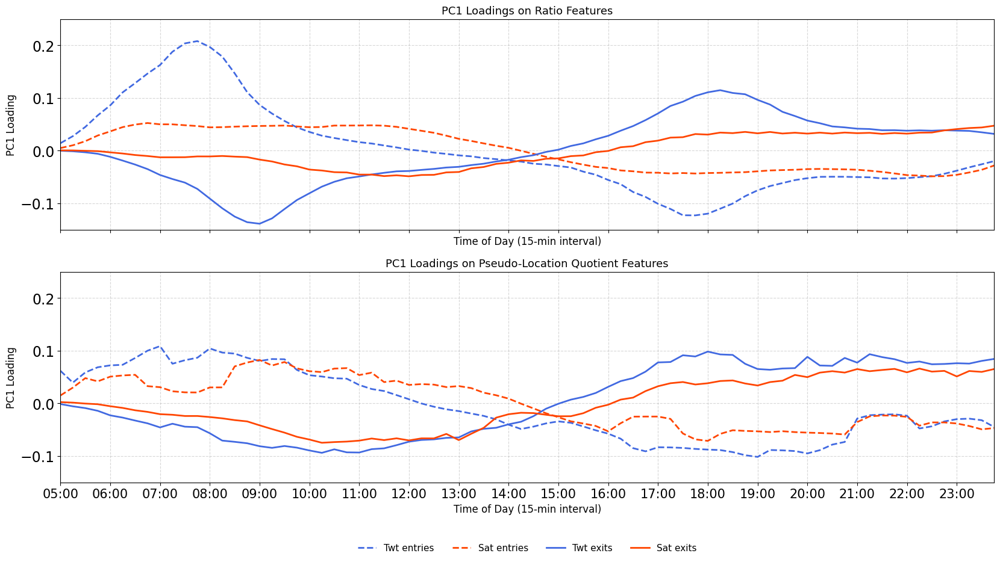

In [88]:
plt.rcParams.update({'font.size': 17})  # 默认 16 起步
def plot_pc1_loadings(df_pc1, quarter_map, title, ax, ylim_range=None):
    # 数据预处理
    df_plot = df_pc1.reset_index()
    df_plot.columns = ['Feature', 'Loading']
    df_plot['Quarter'] = df_plot['Feature'].str.extract(r'^(\d{4}-\d{4})')[0]
    df_plot['Day'] = df_plot['Feature'].str.extract(r'_(mon|twt|fri|sat|sun)_')[0].str.title()
    df_plot['Type'] = df_plot['Feature'].str.extract(r'(entries|exits)')[0].map({'entries': 'entries', 'exits': 'exits'})
    df_plot['TimeIndex'] = df_plot['Quarter'].map(quarter_map)
    df_plot = df_plot.dropna(subset=['TimeIndex'])

    day_colors = {
        'Mon': 'steelblue', 'Twt': 'royalblue', 'Fri': 'black', 'Sat': 'orangered', 'Sun': 'gold'
    }

    for typ in ['entries', 'exits']:
        for day, color in day_colors.items():
            subset = df_plot[(df_plot['Day'] == day) & (df_plot['Type'] == typ)].sort_values('TimeIndex')
            x = subset['TimeIndex'].values
            y = subset['Loading'].values

            if len(x) > 0:
                x = np.insert(x, [0, len(x)], [x[0] - 1, x[-1] + 1])
                y = np.insert(y, [0, len(y)], [np.nan, np.nan])
                ax.plot(x, y, label=f'{day} {typ}', color=color, linewidth=2,
                        linestyle='-' if typ == 'exits' else '--')

    # 设置 X 轴 ticks
    index_to_time = {v: k for k, v in quarter_map.items()}
    xtick_locs = [i for i in sorted(index_to_time) if index_to_time[i][2:4] == '00' or index_to_time[i].endswith('0015')]
    xtick_labels = [f"{index_to_time[i][:2]}:{index_to_time[i][2:4]}" for i in xtick_locs]

    ax.set_xticks(xtick_locs)
    ax.set_xticklabels(xtick_labels, rotation=0, fontsize=15)
    ax.set_xlim(21, 96)
    ax.set_xlabel("Time of Day (15-min interval)", fontsize=12)
    ax.set_ylabel("PC1 Loading", fontsize=12)
    ax.set_title(title, fontsize=13)
    ax.grid(True, linestyle='--', alpha=0.5)

    if ylim_range is not None:
        ax.set_ylim(ylim_range)

# -------------------
# 准备主成分数据
pc1_loading_ratio = pd.Series(pca_ratio.components_[0], index=X_ratio_sec.columns)
pc1_loading_rho = pd.Series(pca_rho.components_[0], index=X_rho_sec.columns)

# 计算统一的 y 轴范围
max_loading = max(abs(pc1_loading_ratio).max(), abs(pc1_loading_rho).max())

# -------------------
# 拼图
fig, axes = plt.subplots(2, 1, figsize=(20, 10), sharex=True)

plot_pc1_loadings(pc1_loading_ratio, quarter_map, "PC1 Loadings on Ratio Features", axes[0], ylim_range=(-0.15, 0.25))
plot_pc1_loadings(pc1_loading_rho, quarter_map, "PC1 Loadings on Pseudo-Location Quotient Features", axes[1], ylim_range=(-0.15, 0.25))

# 图例放底部
axes[1].legend(ncol=5, loc='upper center', bbox_to_anchor=(0.5, -0.25), fontsize=11, frameon=False)

plt.show()

pc1-5里面分四个时间的进出分别观察

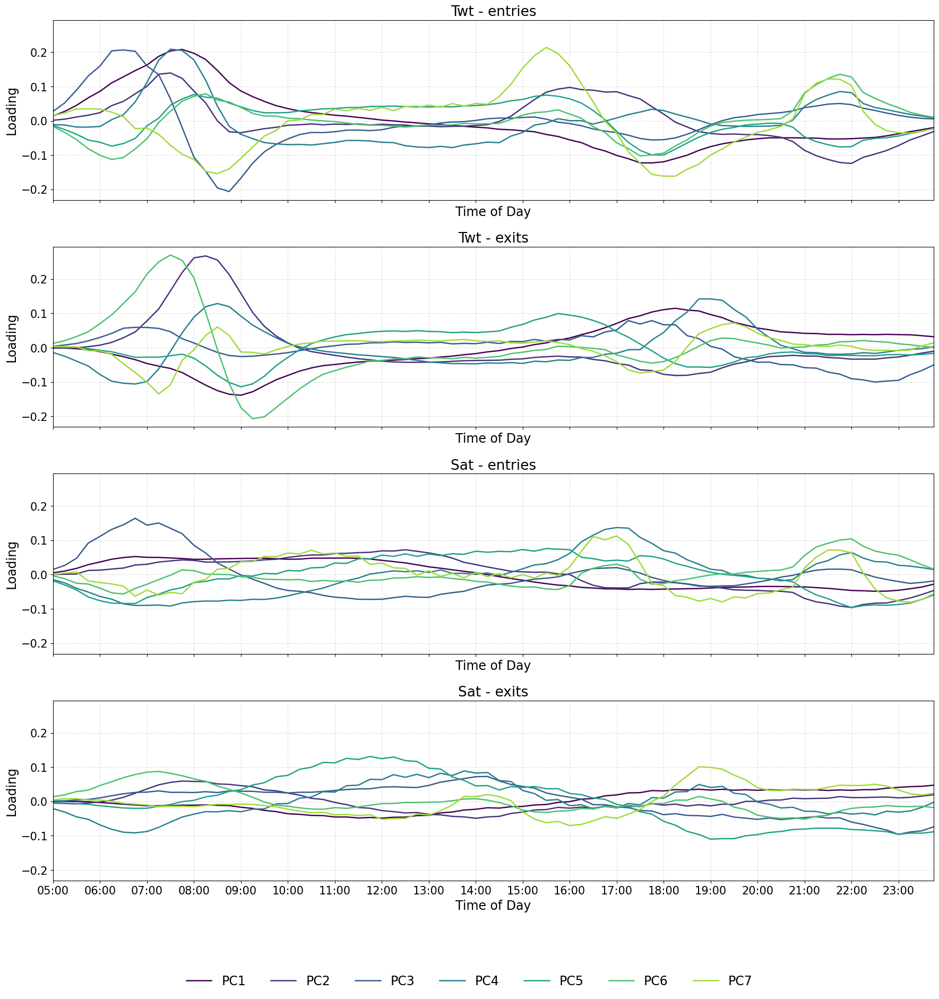

In [91]:
def prepare_pc_loadings(pca_obj, X, quarter_map):
    # 返回一个 DataFrame，每列为 PCi，每行 index 是 feature（含时间、day、entries/exits）
    loading_df = pd.DataFrame(pca_obj.components_[:7].T,  # 只取 PC1–PC6
                              index=X.columns,
                              columns=[f'PC{i+1}' for i in range(7)])
    loading_df = loading_df.reset_index()
    loading_df = loading_df.rename(columns={'index': 'Feature'})

    # 提取时间、日、类型
    loading_df['Quarter'] = loading_df['Feature'].str.extract(r'^(\d{4}-\d{4})')[0]
    loading_df['Day'] = loading_df['Feature'].str.extract(r'_(mon|twt|fri|sat|sun)_')[0].str.title()
    loading_df['Type'] = loading_df['Feature'].str.extract(r'(entries|exits)')[0].map({'entries': 'entries', 'exits': 'exits'})
    loading_df['TimeIndex'] = loading_df['Quarter'].map(quarter_map)
    loading_df = loading_df.dropna(subset=['TimeIndex'])
    
    return loading_df

def plot_one_subplot(ax, df, day, typ, color_map):
    subset = df[(df['Day'] == day) & (df['Type'] == typ)]
    
    for pc in [f'PC{i+1}' for i in range(7)]:
        sub_pc = subset[['TimeIndex', pc]].sort_values('TimeIndex')
        x = sub_pc['TimeIndex'].values
        y = sub_pc[pc].values
        x = np.insert(x, [0, len(x)], [x[0]-1, x[-1]+1])
        y = np.insert(y, [0, len(y)], [np.nan, np.nan])
        ax.plot(x, y, label=pc, color=color_map[pc], linewidth=1.8)

    ax.set_title(f"{day} - {typ}", fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_xlim(21, 96)
    ax.set_xlabel("Time of Day")
    ax.set_ylabel("Loading")

    # 设置时间刻度，跳过 00:00–05:00
    index_to_time = {v: k for k, v in quarter_map.items()}
    xtick_locs = []
    xtick_labels = []

    for i in sorted(index_to_time):
        time_str = index_to_time[i][:4]  # 例如 '0630'
        hour = int(time_str[:2])
        if hour < 5:  # 排除凌晨 0–4 点 + 05:00前的所有时段
            continue
        if time_str[2:4] == '00' or index_to_time[i].endswith('0015'):  # 整点或 00:15 的时段
            xtick_locs.append(i)
            xtick_labels.append(f"{hour:02}:{time_str[2:4]}")

    ax.set_xticks(xtick_locs)
    ax.set_xticklabels(xtick_labels, fontsize=9)

# 主处理逻辑
color_map = {f'PC{i+1}': plt.cm.viridis(i/7) for i in range(7)}  # 给 PC1–6 不同颜色

# 选择使用 ratio 数据
loading_df = prepare_pc_loadings(pca_ratio, X_ratio_sec, quarter_map)

# 选择两天
days = ['Twt', 'Sat']
types = ['entries', 'exits']

fig, axes = plt.subplots(4, 1, figsize=(18, 20), sharex=True, sharey=True)  # 改为4行1列

for idx, (day, typ) in enumerate([(d, t) for d in days for t in types]):
    ax = axes[idx]
    plot_one_subplot(ax, loading_df, day, typ, color_map)
    ax.set_title(f"{day} - {typ}", fontsize=19)          # 标题字体
    ax.set_xlabel("Time of Day", fontsize=17)            # x轴标签字体
    ax.set_ylabel("Loading", fontsize=17)                # y轴标签字体
    ax.tick_params(axis='both', labelsize=15)            # 刻度字体

# 图例统一放底部
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=7, fontsize=17, frameon=False)

plt.tight_layout(rect=[0, 0.07, 1, 0.95])
plt.show()


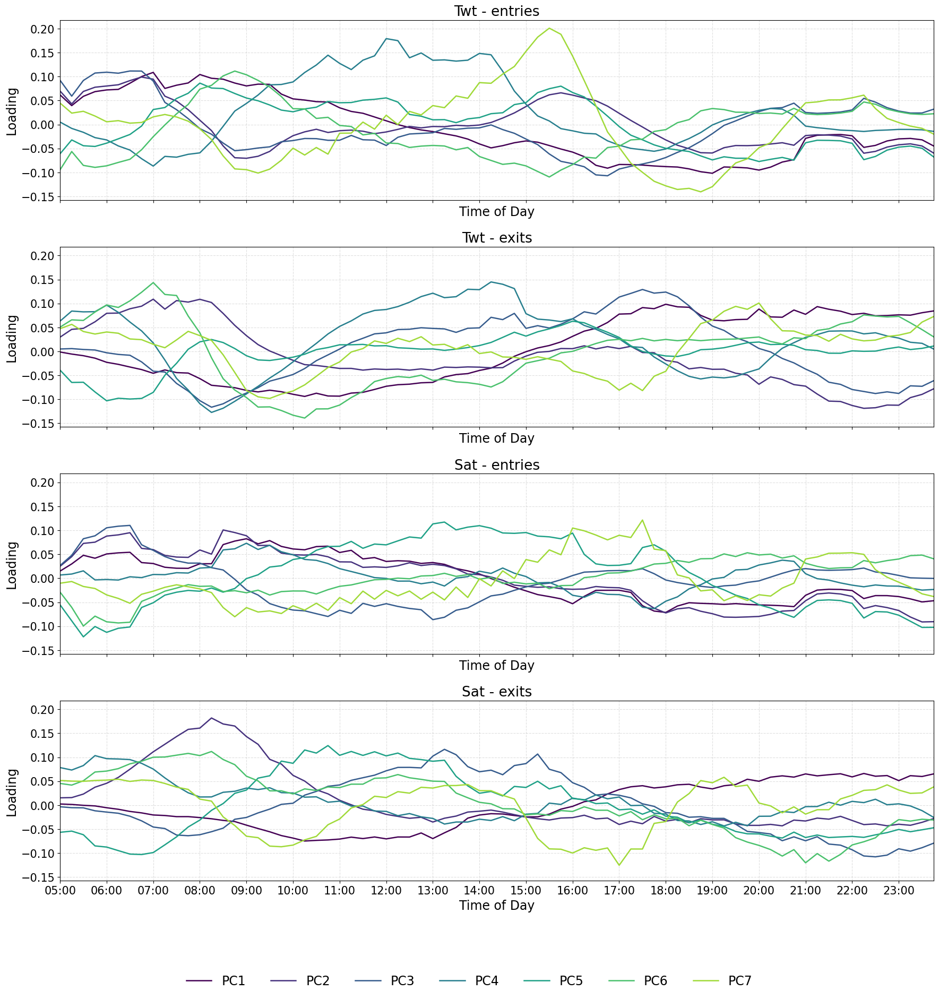

In [93]:
def prepare_pc_loadings(pca_obj, X, quarter_map):
    # 返回一个 DataFrame，每列为 PCi，每行 index 是 feature（含时间、day、entries/exits）
    loading_df = pd.DataFrame(pca_obj.components_[:7].T,  # 只取 PC1–PC6
                              index=X.columns,
                              columns=[f'PC{i+1}' for i in range(7)])
    loading_df = loading_df.reset_index()
    loading_df = loading_df.rename(columns={'index': 'Feature'})

    # 提取时间、日、类型
    loading_df['Quarter'] = loading_df['Feature'].str.extract(r'^(\d{4}-\d{4})')[0]
    loading_df['Day'] = loading_df['Feature'].str.extract(r'_(mon|twt|fri|sat|sun)_')[0].str.title()
    loading_df['Type'] = loading_df['Feature'].str.extract(r'(entries|exits)')[0].map({'entries': 'entries', 'exits': 'exits'})
    loading_df['TimeIndex'] = loading_df['Quarter'].map(quarter_map)
    loading_df = loading_df.dropna(subset=['TimeIndex'])
    
    return loading_df

def plot_one_subplot(ax, df, day, typ, color_map):
    subset = df[(df['Day'] == day) & (df['Type'] == typ)]
    
    for pc in [f'PC{i+1}' for i in range(7)]:
        sub_pc = subset[['TimeIndex', pc]].sort_values('TimeIndex')
        x = sub_pc['TimeIndex'].values
        y = sub_pc[pc].values
        x = np.insert(x, [0, len(x)], [x[0]-1, x[-1]+1])
        y = np.insert(y, [0, len(y)], [np.nan, np.nan])
        ax.plot(x, y, label=pc, color=color_map[pc], linewidth=1.8)

    ax.set_title(f"{day} - {typ}", fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_xlim(21, 96)
    ax.set_xlabel("Time of Day")
    ax.set_ylabel("Loading")

    # 设置时间刻度，跳过 00:00–05:00
    index_to_time = {v: k for k, v in quarter_map.items()}
    xtick_locs = []
    xtick_labels = []

    for i in sorted(index_to_time):
        time_str = index_to_time[i][:4]  # 例如 '0630'
        hour = int(time_str[:2])
        if hour < 5:  # 排除凌晨 0–4 点 + 05:00前的所有时段
            continue
        if time_str[2:4] == '00' or index_to_time[i].endswith('0015'):  # 整点或 00:15 的时段
            xtick_locs.append(i)
            xtick_labels.append(f"{hour:02}:{time_str[2:4]}")

    ax.set_xticks(xtick_locs)
    ax.set_xticklabels(xtick_labels, fontsize=9)

# 主处理逻辑
color_map = {f'PC{i+1}': plt.cm.viridis(i/7) for i in range(7)}  # 给 PC1–6 不同颜色

# 选择使用 ratio 数据
loading_df = prepare_pc_loadings(pca_rho, X_rho_sec, quarter_map)

# 选择两天
days = ['Twt', 'Sat']
types = ['entries', 'exits']

fig, axes = plt.subplots(4, 1, figsize=(18, 20), sharex=True, sharey=True)  # 改为4行1列

for idx, (day, typ) in enumerate([(d, t) for d in days for t in types]):
    ax = axes[idx]
    plot_one_subplot(ax, loading_df, day, typ, color_map)
    ax.set_title(f"{day} - {typ}", fontsize=19)          # 标题字体
    ax.set_xlabel("Time of Day", fontsize=17)            # x轴标签字体
    ax.set_ylabel("Loading", fontsize=17)                # y轴标签字体
    ax.tick_params(axis='both', labelsize=15)            # 刻度字体

# 图例统一放底部
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=7, fontsize=17, frameon=False)

plt.tight_layout(rect=[0, 0.07, 1, 0.95])
plt.show()

这里是讨论两种数据处理之后的聚类结果的不同

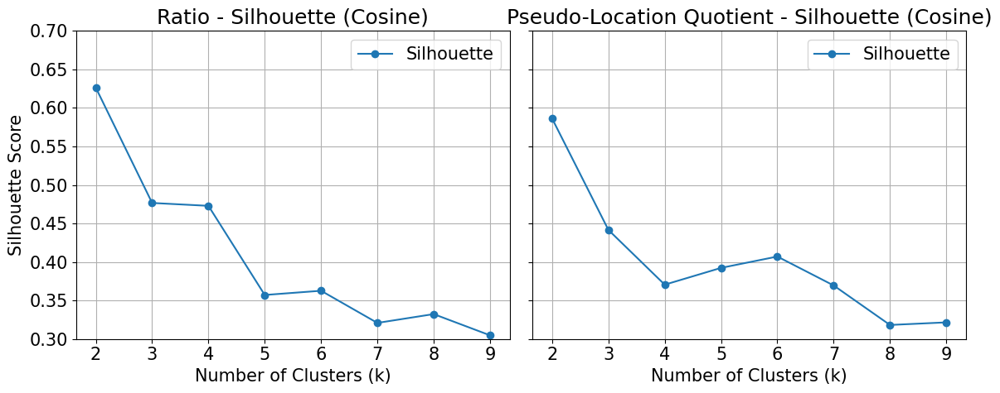

In [95]:
plt.rcParams.update({'font.size': 15})
X_cluster_ratio = X_pca_ratio[:, :7]  # Ratio: PC1–PC7
X_cluster_rho   = X_pca_rho[:, :7]    # Rho: PC1–PC7

K_range = range(2, 10)
results = {}

for name, X_cluster in {'Ratio': X_cluster_ratio, 'Pseudo-Location Quotient': X_cluster_rho}.items():
    inertias = []
    sil_scores = []
    for k in K_range:
        pam = KMedoids(n_clusters=k, metric='cosine', method='pam', random_state=42)
        labels = pam.fit_predict(X_cluster)
        inertias.append(pam.inertia_)
        sil_scores.append(silhouette_score(X_cluster, labels, metric='cosine'))
    results[name] = {'inertia': inertias, 'silhouette': sil_scores}

# ------------------------------
# 绘制 silhouette score 并排子图
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
axes[0].set_ylim(0.3, 0.7)
for ax, (name, data) in zip(axes, results.items()):
    ax.plot(K_range, data['silhouette'], marker='o', label='Silhouette')
    ax.set_title(f"{name} - Silhouette (Cosine)")
    ax.set_xlabel("Number of Clusters (k)")
    ax.set_ylim(0.3, 0.7)
    ax.grid(True)
    ax.legend()

axes[0].set_ylabel("Silhouette Score")

plt.tight_layout()
plt.show()

聚类分析在这里

In [96]:
optimal_k = 6

# ===== 聚类 1：基于 Ratio 特征 =====
pam_ratio = KMedoids(n_clusters=optimal_k, metric='cosine', method='pam', random_state=42)
cluster_labels_ratio = pam_ratio.fit_predict(X_cluster_ratio)

print("🔹 Ratio 特征下每类样本数：")
print(pd.Series(cluster_labels_ratio).value_counts().sort_index())

print("\n🔹 Ratio 聚类的代表样本索引（medoids）：")
print(pam_ratio.medoid_indices_)

print("\n🔹 Ratio 聚类 Silhouette 分数：")
print(silhouette_score(X_cluster_ratio, cluster_labels_ratio, metric='cosine'))

# ===== 聚类 2：基于 Rho 特征（pseudo-location quotient） =====
pam_rho = KMedoids(n_clusters=optimal_k, metric='cosine', method='pam', random_state=42)
cluster_labels_rho = pam_rho.fit_predict(X_cluster_rho)

print("\n🔸 Rho 特征下每类样本数：")
print(pd.Series(cluster_labels_rho).value_counts().sort_index())

print("\n🔸 Rho 聚类的代表样本索引（medoids）：")
print(pam_rho.medoid_indices_)

print("\n🔸 Rho 聚类 Silhouette 分数：")
print(silhouette_score(X_cluster_rho, cluster_labels_rho, metric='cosine'))

🔹 Ratio 特征下每类样本数：
0     44
1    100
2     48
3    115
4     35
5     90
Name: count, dtype: int64

🔹 Ratio 聚类的代表样本索引（medoids）：
[216  59 196 325 261 200]

🔹 Ratio 聚类 Silhouette 分数：
0.36262988857460915

🔸 Rho 特征下每类样本数：
0     30
1     41
2    130
3     25
4    109
5     97
Name: count, dtype: int64

🔸 Rho 聚类的代表样本索引（medoids）：
[261 410 341 161 117  43]

🔸 Rho 聚类 Silhouette 分数：
0.4070539355373043


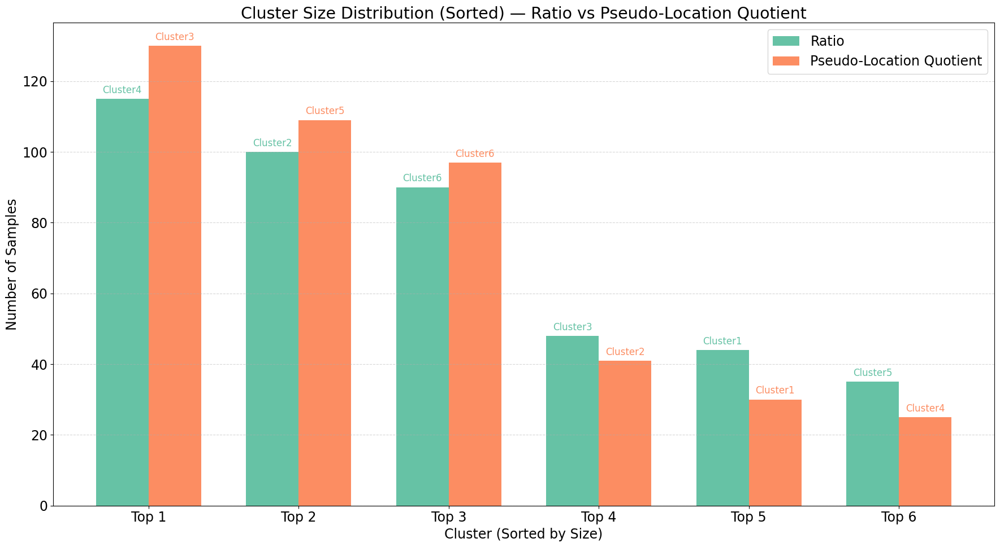

In [100]:
plt.rcParams.update({'font.size': 17})
counts_ratio = pd.Series(cluster_labels_ratio).value_counts().sort_values(ascending=False)
counts_rho = pd.Series(cluster_labels_rho).value_counts().sort_values(ascending=False)

# 提取 cluster 编号（即原始标签）并保持排序一致
cluster_ids_ratio = counts_ratio.index.tolist()
cluster_ids_rho = counts_rho.index.tolist()

x = np.arange(len(counts_ratio))
width = 0.35

plt.figure(figsize=(18, 10))
bars1 = plt.bar(x - width/2, counts_ratio.values, width, label='Ratio', color='#66c2a5')
bars2 = plt.bar(x + width/2, counts_rho.values, width, label='Pseudo-Location Quotient', color='#fc8d62')

# 添加注释：Ratio 柱子标注 cluster+1
for i, bar in enumerate(bars1):
    cluster_label = cluster_ids_ratio[i]
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f'Cluster{cluster_label+1}', ha='center', va='bottom', fontsize=12, color='#66c2a5')

# 添加注释：Rho 柱子标注 cluster+1
for i, bar in enumerate(bars2):
    cluster_label = cluster_ids_rho[i]
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f'Cluster{cluster_label+1}', ha='center', va='bottom', fontsize=12, color='#fc8d62')

plt.xlabel("Cluster (Sorted by Size)")
plt.ylabel("Number of Samples")
plt.title("Cluster Size Distribution (Sorted) — Ratio vs Pseudo-Location Quotient")
plt.xticks(x, [f'Top {i+1}' for i in x])
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

你的地铁站点行为数据是 7 维（PCA 后），人眼看不出结构；

t-SNE 会把它智能压缩到二维（X, Y 坐标）；

保留相似关系 → 相似点仍然靠近，不相似的尽量远离；

最终画出的散点图就是“可视化的聚类结构”。

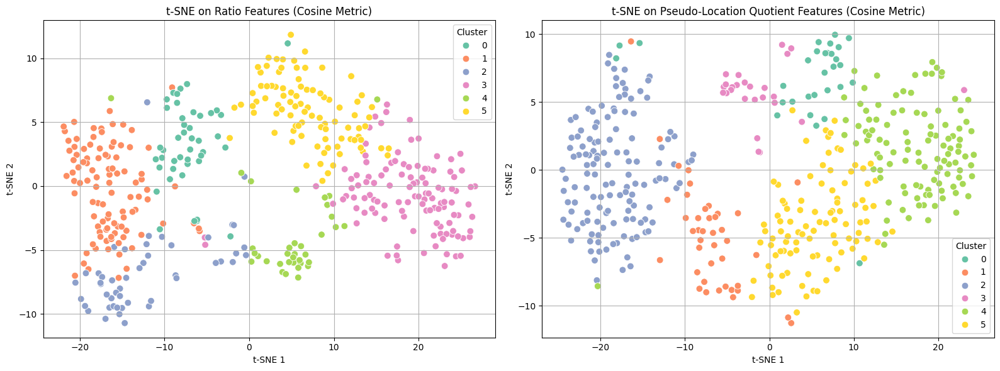

In [51]:
# t-SNE 降维
X_tsne_ratio = TSNE(n_components=2, metric='cosine', random_state=42).fit_transform(X_cluster_ratio)
X_tsne_rho = TSNE(n_components=2, metric='cosine', random_state=42).fit_transform(X_cluster_rho)

# 可视化并列展示
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=False, sharey=False)

# 图 1：ratio 特征
sns.scatterplot(x=X_tsne_ratio[:, 0], y=X_tsne_ratio[:, 1],
                hue=cluster_labels_ratio, palette='Set2', s=60, ax=axes[0])
axes[0].set_title("t-SNE on Ratio Features (Cosine Metric)")
axes[0].set_xlabel("t-SNE 1")
axes[0].set_ylabel("t-SNE 2")
axes[0].grid(True)
axes[0].legend(title='Cluster', loc='best')

# 图 2：rho 特征
sns.scatterplot(x=X_tsne_rho[:, 0], y=X_tsne_rho[:, 1],
                hue=cluster_labels_rho, palette='Set2', s=60, ax=axes[1])
axes[1].set_title("t-SNE on Pseudo-Location Quotient Features (Cosine Metric)")
axes[1].set_xlabel("t-SNE 1")
axes[1].set_ylabel("t-SNE 2")
axes[1].grid(True)
axes[1].legend(title='Cluster', loc='best')

plt.tight_layout()
plt.show()

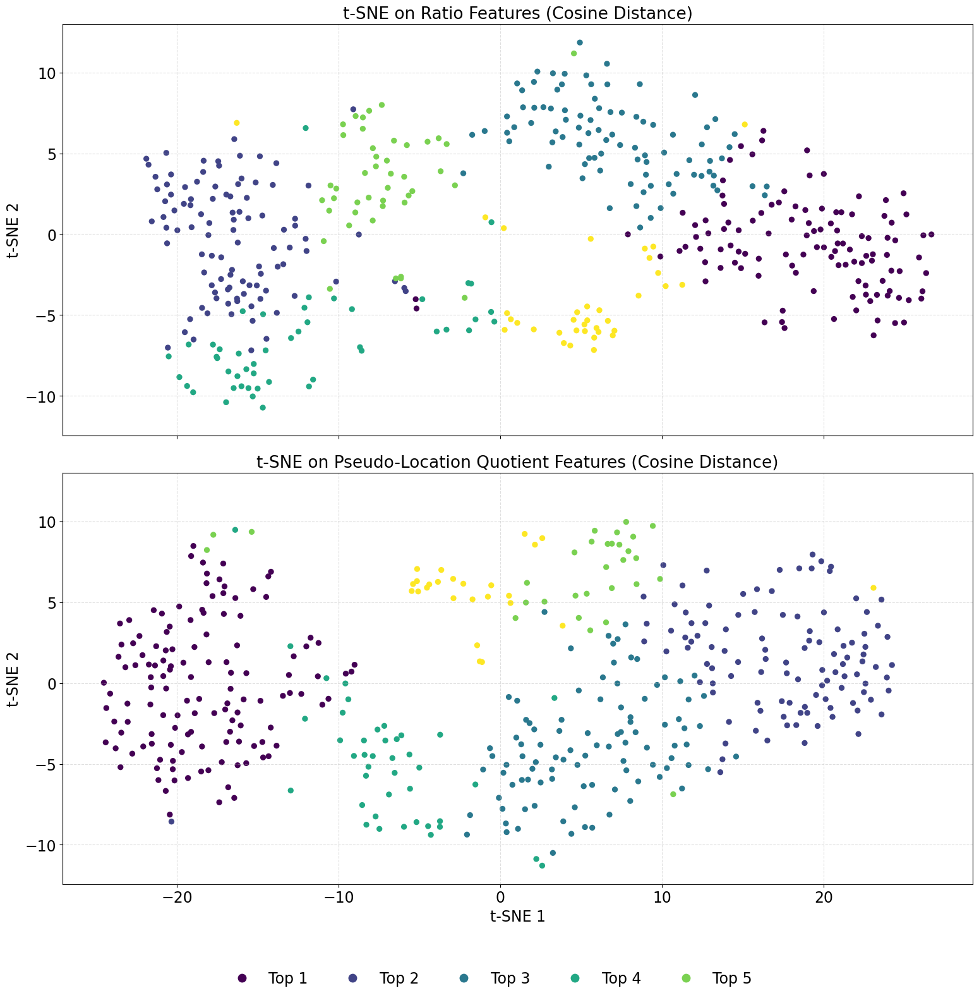

In [103]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

# ===== 1) t-SNE 降维 =====
X_tsne_ratio = TSNE(n_components=2, metric='cosine', random_state=42).fit_transform(X_cluster_ratio)
X_tsne_rho   = TSNE(n_components=2, metric='cosine', random_state=42).fit_transform(X_cluster_rho)

# ===== 2) 工具函数：按簇大小排名，生成颜色映射 =====
def rank_clusters_by_size(labels):
    unique, counts = np.unique(labels, return_counts=True)
    order = sorted(zip(unique, counts), key=lambda x: x[1], reverse=True)  # 大到小排序
    label_to_rank = {lab: i+1 for i, (lab, _) in enumerate(order)}         # 最大簇 = Top 1
    label_to_size = {lab: cnt for lab, cnt in order}
    return label_to_rank, label_to_size, order

def build_palette(n):
    cmap = plt.cm.viridis(np.linspace(0, 1, n))
    return {rank: tuple(cmap[rank-1]) for rank in range(1, n+1)}

# ratio 聚类信息
label_to_rank_r, label_to_size_r, order_r = rank_clusters_by_size(cluster_labels_ratio)
ranks_ratio = np.vectorize(label_to_rank_r.get)(cluster_labels_ratio)
n_clusters_r = len(np.unique(cluster_labels_ratio))
palette_r = build_palette(n_clusters_r)

# rho 聚类信息
label_to_rank_h, label_to_size_h, order_h = rank_clusters_by_size(cluster_labels_rho)
ranks_rho = np.vectorize(label_to_rank_h.get)(cluster_labels_rho)
n_clusters_h = len(np.unique(cluster_labels_rho))
palette_h = build_palette(n_clusters_h)

# ===== 3) 统一坐标范围 & 比例 =====
all_x = np.concatenate([X_tsne_ratio[:, 0], X_tsne_rho[:, 0]])
all_y = np.concatenate([X_tsne_ratio[:, 1], X_tsne_rho[:, 1]])
x_min, x_max = all_x.min(), all_x.max()
y_min, y_max = all_y.min(), all_y.max()
x_pad = 0.05 * (x_max - x_min)
y_pad = 0.05 * (y_max - y_min)
xlim = (x_min - x_pad, x_max + x_pad)
ylim = (y_min - y_pad, y_max + y_pad)

# ===== 4) 字体设置 =====
plt.rcParams.update({'font.size': 17})

# ===== 5) 绘图函数（不显示图内编号） =====
def scatter_by_rank(ax, X2d, ranks, palette, title):
    sns.scatterplot(
        x=X2d[:, 0], y=X2d[:, 1],
        hue=ranks,
        palette=palette,
        s=45, edgecolor='none', ax=ax, legend=False
    )
    ax.set_title(title, fontsize=19)
    ax.set_xlabel("t-SNE 1", fontsize=17)
    ax.set_ylabel("t-SNE 2", fontsize=17)
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_xlim(*xlim)
    ax.set_ylim(*ylim)
    ax.set_aspect('equal', adjustable='box')

# ===== 6) 画上下两个图 =====
fig, axes = plt.subplots(2, 1, figsize=(18, 16), sharex=True, sharey=True)

scatter_by_rank(axes[0], X_tsne_ratio, ranks_ratio, palette_r,
                "t-SNE on Ratio Features (Cosine Distance)")
scatter_by_rank(axes[1], X_tsne_rho, ranks_rho, palette_h,
                "t-SNE on Pseudo-Location Quotient Features (Cosine Distance)")

# ===== 全局图例（Top 1–Top 5，无样本数量） =====
def make_legend_handles_simple(label_to_rank, color_map, max_rank=5, title_prefix="Top"):
    handles, labels = [], []
    for rk in range(1, max_rank + 1):
        if rk in color_map:
            handles.append(Line2D([0], [0], marker='o', linestyle='',
                                  markersize=10, markerfacecolor=color_map[rk], markeredgecolor='none'))
            labels.append(f"{title_prefix} {rk}")
    return handles, labels

handles, labels = make_legend_handles_simple(label_to_rank_r, palette_r)

fig.legend(handles, labels, loc='lower center', ncol=5, frameon=False, fontsize=17)
plt.tight_layout(rect=[0, 0.06, 1, 1])
plt.show()


In [104]:
ratio_result = pd.DataFrame({
    'NLC': X_ratio_sec.index,
    'cluster_ratio': cluster_labels_ratio
})

In [105]:
cluster_counts_medoidos = pd.Series(cluster_labels_ratio).value_counts().sort_index()
print(cluster_counts_medoidos)

0     44
1    100
2     48
3    115
4     35
5     90
Name: count, dtype: int64


In [106]:
# 合并到 GeoDataFrame，确保 NLC 类型一致
stations = stations[['NLC', 'NAME', 'Zone', 'LINES', 'NETWORK', 'geometry']]
stations['NLC'] = stations['NLC'].astype(str)
ratio_result['NLC'] = ratio_result['NLC'].astype(str)

# 合并聚类标签
stations_ratio = stations.merge(ratio_result, on='NLC', how='inner')

# 如果有缺失（未参与聚类的站点），设为 -1 类别
stations_ratio['cluster_ratio'] = stations_ratio['cluster_ratio'].fillna(-1).astype(int)

In [107]:
stations_ratio.to_file("data/cluster/stations_ratio_4.geojson", driver="GeoJSON")

In [108]:
rho_result = pd.DataFrame({
    'NLC': X_rho_sec.index,
    'cluster_rho': cluster_labels_rho
})
print(rho_result.head())

    NLC  cluster_rho
0   750            3
1  1404            0
2  3000            5
3   500            0
4   502            2


In [109]:
# 合并到 GeoDataFrame，确保 NLC 类型一致
stations = stations[['NLC', 'NAME', 'Zone', 'LINES', 'NETWORK', 'geometry']]
stations['NLC'] = stations['NLC'].astype(str)
rho_result['NLC'] = rho_result['NLC'].astype(str)

# 合并聚类标签
stations_rho = stations.merge(rho_result, on='NLC', how='inner')

# 如果有缺失（未参与聚类的站点），设为 -1 类别
stations_rho['cluster_rho'] = stations_rho['cluster_rho'].fillna(-1).astype(int)

In [110]:
print("medoid_indices:", pam_rho.medoid_indices_)
print("labels at medoids:", cluster_labels_rho[pam_rho.medoid_indices_])

medoid_indices: [261 410 341 161 117  43]
labels at medoids: [0 1 2 3 4 5]


In [111]:
# 1. 提取 medoid 的索引位置
medoid_indices = pam_rho.medoid_indices_

# 2. 根据索引位置找到 NLC（对应于你 X_rho.index 的顺序）
medoid_nlcs = X_rho_sec.index[medoid_indices].astype(str)  # 保证 NLC 是 str 类型

# 3. 合并站点信息
stations_subset = stations[['NLC', 'NAME']].copy()
stations_subset['NLC'] = stations_subset['NLC'].astype(str)

# 4. 构建最终 DataFrame
medoids_df = pd.DataFrame({
    'original_index': medoid_indices,
    'NLC': medoid_nlcs,
    'cluster_label': np.arange(len(medoid_indices))
}).merge(stations_subset, on='NLC', how='left')

# 5. 打印结果
print("\n✅ 每个簇的代表性站点（medoid）")
print(medoids_df[['cluster_label', 'original_index', 'NLC', 'NAME']])


✅ 每个簇的代表性站点（medoid）
   cluster_label  original_index   NLC             NAME
0              0             261   661        Northwood
1              1             410   754  Westbourne Park
2              2             341   697       St. Paul's
3              3             161   596        Harlesden
4              4             117   571         Elm Park
5              5              43  5404         Brockley


In [112]:
top_k = 5

# 1. 获取聚类标签 & medoid 索引
labels = pam_rho.labels_
medoid_indices = pam_rho.medoid_indices_

# 2. 计算每个样本到其所在簇的 medoid 的距离
X_array = X_rho_sec.values  # 确保是 numpy array
distances_to_medoids = pairwise_distances(X_array, X_array[medoid_indices],metric='cosine')  # 所有样本到所有 medoid 的距离

# 3. 遍历每个 cluster，找到距离其 medoid 最近的 top_k 个样本
top_representatives = []

for cluster_id, medoid_idx in enumerate(medoid_indices):
    cluster_member_indices = np.where(labels == cluster_id)[0]
    dists = distances_to_medoids[cluster_member_indices, cluster_id]
    top_indices_in_cluster = cluster_member_indices[np.argsort(dists)[:top_k]]

    for i, idx in enumerate(top_indices_in_cluster):
        top_representatives.append({
            'cluster_label': cluster_id,
            'rank': i + 1,
            'original_index': idx,
            'NLC': str(X_rho_sec.index[idx])
        })

# 4. 转为 DataFrame 并合并站点信息
top_df = pd.DataFrame(top_representatives)
stations_subset = stations[['NLC', 'NAME']].copy()
stations_subset['NLC'] = stations_subset['NLC'].astype(str)
top_df = top_df.merge(stations_subset, on='NLC', how='left')

# 5. 排序展示
top_df = top_df.sort_values(by=['cluster_label', 'rank'])

# ✅ 打印结果
print(f"\n 每个簇中最具代表性的前 {top_k} 个站点：")
print(top_df[['cluster_label', 'rank', 'original_index', 'NLC', 'NAME']])


 每个簇中最具代表性的前 5 个站点：
    cluster_label  rank  original_index   NLC                    NAME
0               0     1             261   661               Northwood
1               0     2             396   753              West Acton
2               0     3              36   526            Boston Manor
3               0     4               3   500              Acton Town
4               0     5             104   561           Ealing Common
5               1     1             410   754         Westbourne Park
6               1     2             418   767               Wimbledon
7               1     3             411   865               Westferry
8               1     4             100   897         Deptford Bridge
9               1     5             356   723           Swiss Cottage
10              2     1             341   697              St. Paul's
11              2     2             339   695        St. James's Park
12              2     3             296   685           Regent's Park

In [113]:
top_df.to_csv("cluster_situation.csv", index=True)

In [114]:
stations_rho.to_file("data/cluster/stations_rho_4.geojson", driver="GeoJSON")

In [115]:
stations_rho

,NLC,NAME,Zone,LINES,NETWORK,geometry,cluster_rho
0,500,Acton Town,3,"District, Piccadilly",London Underground,POINT (519478 179592),0
1,501,Barbican,1,"Circle, Hammersmith & City, Metropolitan",London Underground,POINT (532004 181856),2
2,502,Aldgate,1,"Circle, Metropolitan",London Underground,POINT (533613 181262),2
3,503,Aldgate East,1,"District, Hammersmith & City",London Underground,POINT (533936 181375),2
4,504,Stratford International DLR,"2,3",DLR,None,POINT (538128 184761),2
...,...,...,...,...,...,...,...
426,7467,Woodgrange Park,"3,4",London Overground,None,POINT (541821 185350),4
427,7473,Emerson Park,6,London Overground,None,POINT (553962 187871),4
428,9586,Imperial Wharf,2,London Overground,None,POINT (526291 176691),2
429,9587,Shepherd's Bush NR,2,London Overground,None,POINT (523720 179920),2


In [116]:
london_outer = gpd.read_file('data/london/London_Borough_InnerOuter.shp')
london_outer_webmerc = london_outer.to_crs(epsg=3857)

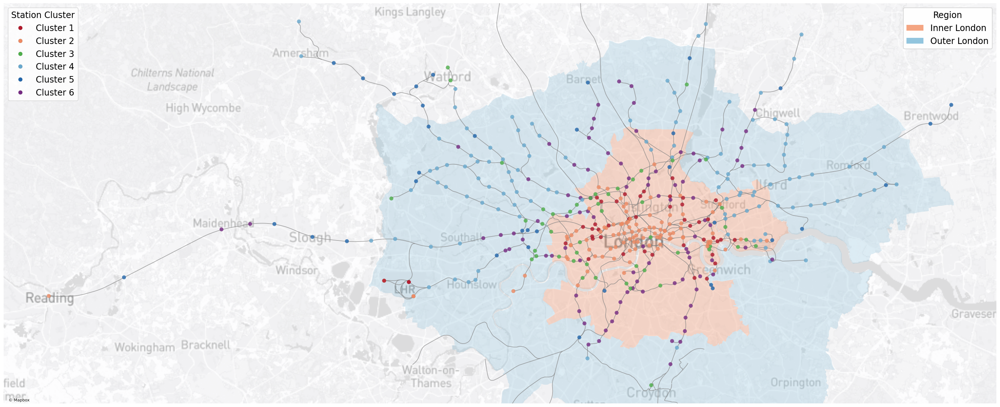

In [ ]:
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.lines import Line2D
import contextily as ctx
from xyzservices import TileProvider
from matplotlib.patches import Patch

# 重新投影
stations_cluster_webmerc = stations_ratio.to_crs(epsg=3857)
lines_webmerc = lines.to_crs(epsg=3857)

# 添加新的聚类标签字段（1–6）
stations_cluster_webmerc['cluster_ratio_1'] = stations_cluster_webmerc['cluster_ratio'] + 1
stations_cluster_webmerc['cluster_ratio_1'] = stations_cluster_webmerc['cluster_ratio_1'].astype(int)

# 自定义聚类颜色（确保包括所有 cluster 值）
cluster_colors = {
    1: '#b2182b',
    2: '#ef8a62',
    3: '#4daf4a',
    4: '#67a9cf',
    5: '#2166ac',
    6: '#762a83'
}

region_colors = {
    'Inner': '#f4a582',   # 内伦敦：浅橙
    'Outer': '#92c5de'    # 外伦敦：浅蓝
}


# 设置图形
fig, ax = plt.subplots(figsize=(28, 15))

minx, miny, maxx, maxy = stations_cluster_webmerc.total_bounds
padding_x = (maxx - minx) * 0.05
padding_y = (maxy - miny) * 0.05
ax.set_xlim(minx - padding_x, maxx + padding_x)
ax.set_ylim(miny - padding_y, maxy + padding_y)

token = "pk.eyJ1Ijoid3d3MDYwIiwiYSI6ImNsZWNyZXU0OTAwbWEzb3RlaDF5bzBrcXUifQ.XpmvYQZRVRCNwe1mtcgYVg" 
mapbox_provider = TileProvider(
    name="Mapbox Light",
    url=f"https://api.mapbox.com/styles/v1/mapbox/light-v11/tiles/{{z}}/{{x}}/{{y}}?access_token={token}",
    attribution="© Mapbox",
    max_zoom=20
)

# 2) 先加底图，放在最底层
ctx.add_basemap(
    ax,
    source=mapbox_provider,
    crs=stations_cluster_webmerc.crs,
    zorder=-1   # 关键：给 add_basemap 传 zorder，而不是 TileProvider
)

# 3) 画内/外伦敦区域（在底图之上）
for region, gdf in london_outer_webmerc.groupby('Region'):
    gdf.plot(
        ax=ax,
        facecolor=region_colors.get(region, '#cccccc'),  # fallback color
        edgecolor='black',
        linewidth=0.0,
        alpha=0.3 if region == 'Outer' else 0.4,  # 内伦敦稍高透明度
        zorder=0
    )

# 4) 画线路
lines_webmerc.plot(
    ax=ax,
    linewidth=1.2,
    color='gray',
    alpha=0.7,
    zorder=1
)

# 5) 画站点
stations_cluster_webmerc.plot(
    ax=ax,
    markersize=60,
    alpha=0.80,
    linewidth=0.05,
    edgecolor='black',
    color=stations_cluster_webmerc['cluster_ratio_1'].map(cluster_colors).fillna('#cccccc'),
    zorder=2
)

# 6) 最后加 Cluster 图例与标题
cluster_legend = [
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor=color,
           markeredgecolor='black',
           markeredgewidth=0.1,
           label=f'Cluster {k}', markersize=8)
    for k, color in cluster_colors.items()
]

# --- 内外伦敦区域图例 ---
region_legend = [
    Patch(facecolor='#f4a582', label='Inner London'),
    Patch(facecolor='#92c5de', label='Outer London')
]

# --- 绘制主图 ---
#（你已绘制好站点、线路、区域，此处略）

# --- 添加图例：左上角为 Cluster，右上角为 Region ---
first_legend = ax.legend(handles=cluster_legend, title='Station Cluster',
                         loc='upper left', frameon=True,
                         fontsize=17, title_fontsize=17)

second_legend = ax.legend(handles=region_legend, title='Region',
                          loc='upper right', frameon=True,
                          fontsize=17, title_fontsize=17)
ax.add_artist(first_legend)
ax.add_artist(second_legend)
ax.set_axis_off()
#ax.set_title("TfL Station Clusters (Ratio)", fontsize=16, fontweight='bold', pad=16)
plt.tight_layout()
plt.show()

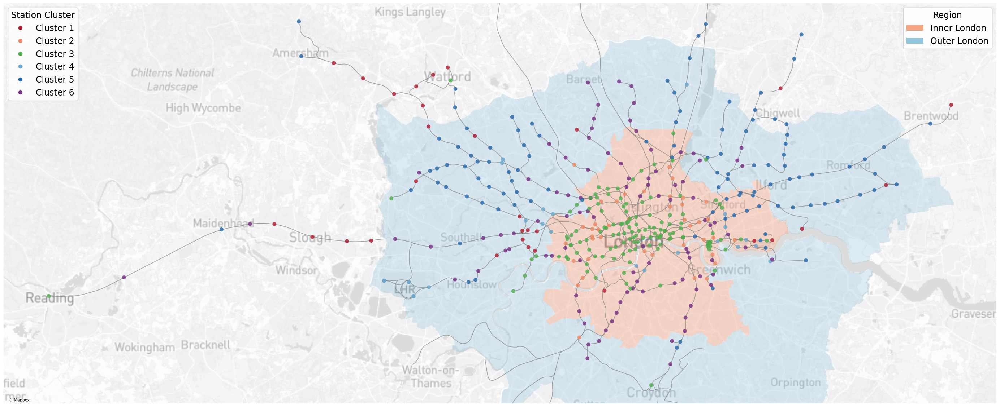

In [125]:
# 重新投影
stations_cluster_rho = stations_rho.to_crs(epsg=3857)
lines_webmerc = lines.to_crs(epsg=3857)

# 添加新的聚类标签字段（1–6）
stations_cluster_rho['cluster_rho_1'] = stations_cluster_rho['cluster_rho'] + 1
stations_cluster_rho['cluster_rho_1'] = stations_cluster_rho['cluster_rho_1'].astype(int)

# 自定义聚类颜色（确保包括所有 cluster 值）
cluster_colors = {
    1: '#b2182b',
    2: '#ef8a62',
    3: '#4daf4a',
    4: '#67a9cf',
    5: '#2166ac',
    6: '#762a83'
}

region_colors = {
    'Inner': '#f4a582',   # 内伦敦：浅橙
    'Outer': '#92c5de'    # 外伦敦：浅蓝
}


# 设置图形
fig, ax = plt.subplots(figsize=(28, 20))

minx, miny, maxx, maxy = stations_cluster_webmerc.total_bounds
padding_x = (maxx - minx) * 0.05
padding_y = (maxy - miny) * 0.05
ax.set_xlim(minx - padding_x, maxx + padding_x)
ax.set_ylim(miny - padding_y, maxy + padding_y)
token = "pk.eyJ1Ijoid3d3MDYwIiwiYSI6ImNsZWNyZXU0OTAwbWEzb3RlaDF5bzBrcXUifQ.XpmvYQZRVRCNwe1mtcgYVg" 
mapbox_provider = TileProvider(
    name="Mapbox Light",
    url=f"https://api.mapbox.com/styles/v1/mapbox/light-v11/tiles/{{z}}/{{x}}/{{y}}?access_token={token}",
    attribution="© Mapbox",
    max_zoom=20
)

# 2) 先加底图，放在最底层
ctx.add_basemap(
    ax,
    source=mapbox_provider,
    crs=stations_cluster_webmerc.crs,
    zorder=-1   # 关键：给 add_basemap 传 zorder，而不是 TileProvider
)

# 3) 画内/外伦敦区域（在底图之上）
for region, gdf in london_outer_webmerc.groupby('Region'):
    gdf.plot(
        ax=ax,
        facecolor=region_colors.get(region, '#cccccc'),  # fallback color
        edgecolor='black',
        linewidth=0.0,
        alpha=0.3 if region == 'Outer' else 0.4,  # 内伦敦稍高透明度
        zorder=0
    )

# 4) 画线路
lines_webmerc.plot(
    ax=ax,
    linewidth=1.2,
    color='gray',
    alpha=0.7,
    zorder=1
)

# 5) 画站点
stations_cluster_rho.plot(
    ax=ax,
    markersize=60,
    alpha=0.80,
    linewidth=0.05,
    edgecolor='black',
    color= stations_cluster_rho['cluster_rho_1'].map(cluster_colors).fillna('#cccccc'),
    zorder=2
)

# 6) 最后加 Cluster 图例与标题
cluster_legend = [
    Line2D([0], [0], marker='o', color='w',
           markerfacecolor=color,
           markeredgecolor='black',
           markeredgewidth=0.1,
           label=f'Cluster {k}', markersize=8)
    for k, color in cluster_colors.items()
]

# --- 内外伦敦区域图例 ---
region_legend = [
    Patch(facecolor='#f4a582', label='Inner London'),
    Patch(facecolor='#92c5de', label='Outer London')
]

# --- 绘制主图 ---
#（你已绘制好站点、线路、区域，此处略）

# --- 添加图例：左上角为 Cluster，右上角为 Region ---
first_legend = ax.legend(handles=cluster_legend, title='Station Cluster',
                         loc='upper left', frameon=True,
                         fontsize=17, title_fontsize=17)

second_legend = ax.legend(handles=region_legend, title='Region',
                          loc='upper right', frameon=True,
                          fontsize=17, title_fontsize=17)
ax.add_artist(first_legend)
ax.add_artist(second_legend)
ax.set_axis_off()
#ax.set_title("TfL Station Clusters (Pseudo-Location Quotient)", fontsize=16, fontweight='bold', pad=16)
plt.tight_layout()
plt.show()

## mean

In [ ]:
# 1️ 要排除的非数值列
exclude_cols = ['NLC', 'ASC', 'StationFare', 'Zone', 'cluster_ratio', 'Station', 'Fare Zone']

# 2️ 选择数值列（时段客流数据）
value_cols = [col for col in analyse_df.columns if col not in exclude_cols]

# 3️ === 先对每个站点进行归一化 ===
# 计算每个站点的全天总 entries 和 exits
analyse_df['total_entries'] = analyse_df.filter(like='_entries').sum(axis=1)
analyse_df['total_exits']   = analyse_df.filter(like='_exits').sum(axis=1)

# 每个时段除以当天总量，得到比例
for col in analyse_df.filter(like='_entries').columns:
    analyse_df[col] = analyse_df[col] / analyse_df['total_entries']

for col in analyse_df.filter(like='_exits').columns:
    analyse_df[col] = analyse_df[col] / analyse_df['total_exits']

# 4️ === 再按 cluster 求平均 ===
entry_cols = analyse_df.filter(like='_entries').drop(columns='total_entries').columns
exit_cols  = analyse_df.filter(like='_exits').drop(columns='total_exits').columns

entries_profiles = analyse_df.groupby('cluster_ratio')[entry_cols].mean()
exits_profiles   = analyse_df.groupby('cluster_ratio')[exit_cols].mean()

In [ ]:
entries_profiles

In [ ]:
# 1️ 要排除的非数值列
exclude_cols = ['NLC', 'ASC', 'StationFare', 'Zone', 'cluster_ratio', 'Station', 'Fare Zone']

# 2️ 选择数值列（时段客流数据）
value_cols = [col for col in analyse_df.columns if col not in exclude_cols]

# 3️ === 先对每个站点进行归一化 ===
# 计算每个站点的全天总 entries 和 exits
analyse_df['total_entries'] = analyse_df.filter(like='_entries').sum(axis=1)
analyse_df['total_exits']   = analyse_df.filter(like='_exits').sum(axis=1)

# 每个时段除以当天总量，得到比例
for col in analyse_df.filter(like='_entries').columns:
    analyse_df[col] = analyse_df[col] / analyse_df['total_entries']

for col in analyse_df.filter(like='_exits').columns:
    analyse_df[col] = analyse_df[col] / analyse_df['total_exits']

# 4️ === 再按 cluster 求平均 ===
entry_cols = analyse_df.filter(like='_entries').drop(columns='total_entries').columns
exit_cols  = analyse_df.filter(like='_exits').drop(columns='total_exits').columns

entries_profiles = analyse_df.groupby('cluster_ratio')[entry_cols].mean()
exits_profiles   = analyse_df.groupby('cluster_ratio')[exit_cols].mean()

In [ ]:
# 设置 day 列顺序（如有调整，请修改这里）
day_list = ['mon', 'twt', 'fri', 'sat', 'sun']

# 从列名中提取小时起始时间
def extract_hour(col):
    time_range = col.split('_')[0]  # '0330-0345'
    return f"{time_range[:2]}:{time_range[2:4]}"  # '03:30'

# 提取所有时间起始点（用于列顺序）
hour_list = sorted({extract_hour(col) for col in entries_profiles.columns},
                   key=lambda x: int(x[:2]) * 60 + int(x[3:]))

# 创建热力图数据：每类 → day × hour 网格
for cluster_id, row in entries_profiles.iterrows():
    # 初始化热力图数据表
    heatmap_data = pd.DataFrame(0.0, index=day_list, columns=hour_list)

    for col in row.index:
        try:
            time_range, day, action = col.split('_')
            hour_start = f"{time_range[:2]}:{time_range[2:4]}"
            heatmap_data.loc[day, hour_start] += row[col]
        except:
            continue  # 跳过格式不规范的列

    # 画图
    plt.figure(figsize=(14, 4))
    ax = sns.heatmap(
        heatmap_data,
        cmap='Reds',
        linewidths=0.05,
        linecolor='white',
        vmin=0,
        vmax=0.01,
        square=True,
        cbar_kws={'shrink': 0.3, 'label': 'Density', 'orientation': 'vertical'}  # 控制图例大小
    )

    # 设置图例字体
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=8)  # 图例刻度
    cbar.set_label('Density', fontsize=9)  # 图例标题

    # 设置标题和坐标轴标签字体
    plt.title(f'Cluster {cluster_id}: Weekly Travel Behavior Heatmap', fontsize=10)
    plt.xlabel('Start Time', fontsize=9)
    plt.ylabel('Day', fontsize=9)

    # 设置坐标刻度字体
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=8, rotation=45)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)

    plt.tight_layout()
    plt.show()

In [ ]:
# 设置 day 列顺序（如有调整，请修改这里）
day_list = ['mon', 'twt', 'fri', 'sat', 'sun']

# 从列名中提取小时起始时间
def extract_hour(col):
    time_range = col.split('_')[0]  # '0330-0345'
    return f"{time_range[:2]}:{time_range[2:4]}"  # '03:30'

# 提取所有时间起始点（用于列顺序）
hour_list = sorted({extract_hour(col) for col in exits_profiles.columns},
                   key=lambda x: int(x[:2]) * 60 + int(x[3:]))

# 创建热力图数据：每类 → day × hour 网格
for cluster_id, row in exits_profiles.iterrows():
    # 初始化热力图数据表
    heatmap_data = pd.DataFrame(0.0, index=day_list, columns=hour_list)

    for col in row.index:
        try:
            time_range, day, action = col.split('_')
            hour_start = f"{time_range[:2]}:{time_range[2:4]}"
            heatmap_data.loc[day, hour_start] += row[col]
        except:
            continue  # 跳过格式不规范的列

    # 画图
    plt.figure(figsize=(14, 4))
    ax = sns.heatmap(
        heatmap_data,
        cmap='Blues',
        linewidths=0.05,
        linecolor='white',
        vmin=0,
        vmax=0.01,
        square=True,
        cbar_kws={'shrink': 0.3, 'label': 'Density', 'orientation': 'vertical'}  # 控制图例大小
    )

    # 设置图例字体
    cbar = ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=8)  # 图例刻度
    cbar.set_label('Density', fontsize=9)  # 图例标题

    # 设置标题和坐标轴标签字体
    plt.title(f'Cluster {cluster_id}: Weekly Travel Behavior Heatmap', fontsize=10)
    plt.xlabel('Start Time', fontsize=9)
    plt.ylabel('Day', fontsize=9)

    # 设置坐标刻度字体
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=8, rotation=45)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)

    plt.tight_layout()
    plt.show()

In [54]:
analyse_df['NLC'] = analyse_df['NLC'].astype(str)
rho_result['NLC'] = rho_result['NLC'].astype(str)
# 若 result 中有 cluster 标签列（或其他聚类相关列）
analyse_rho = analyse_df.merge(rho_result[['NLC','cluster_rho']], on='NLC', how='left')

In [55]:
# 1️ 要排除的非数值列
exclude_cols = ['NLC', 'ASC', 'StationFare', 'Zone', 'cluster_ratio', 'Station', 'Fare Zone']

# 2️ 选择数值列（时段客流数据）
value_cols = [col for col in analyse_rho.columns if col not in exclude_cols]

# 3️ === 先对每个站点进行归一化 ===
# 计算每个站点的全天总 entries 和 exits
analyse_rho['total_entries'] = analyse_rho.filter(like='_entries').sum(axis=1)
analyse_rho['total_exits']   = analyse_rho.filter(like='_exits').sum(axis=1)

# 每个时段除以当天总量，得到比例
for col in analyse_rho.filter(like='_entries').columns:
    analyse_rho[col] = analyse_rho[col] / analyse_rho['total_entries']

for col in analyse_rho.filter(like='_exits').columns:
    analyse_rho[col] = analyse_rho[col] / analyse_rho['total_exits']

# 4️ === 再按 cluster 求平均 ===
entry_cols = analyse_rho.filter(like='_entries').drop(columns='total_entries').columns
exit_cols  = analyse_rho.filter(like='_exits').drop(columns='total_exits').columns

entries_profiles = analyse_rho.groupby('cluster_rho')[entry_cols].mean()
exits_profiles   = analyse_rho.groupby('cluster_rho')[exit_cols].mean()

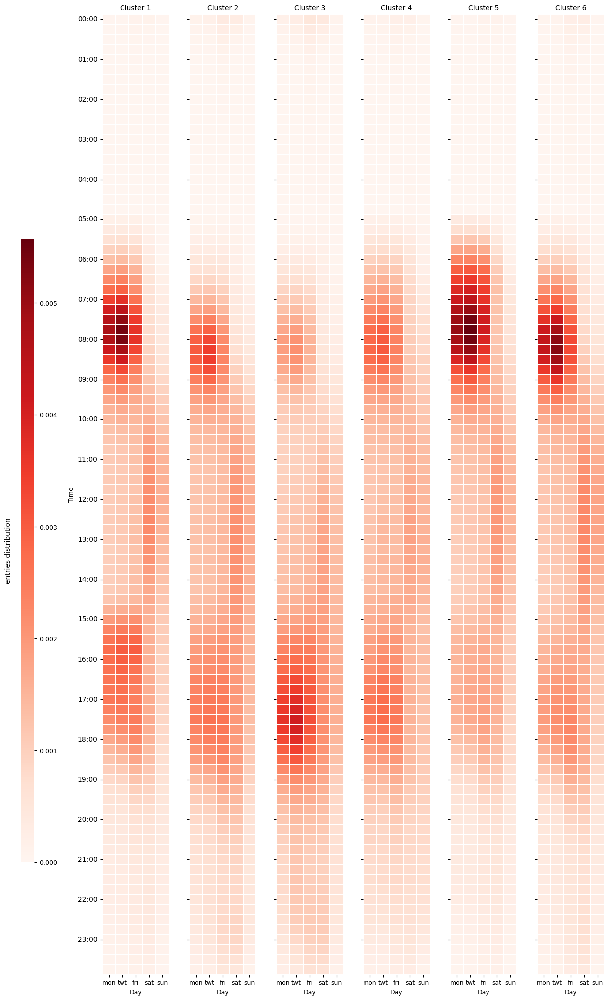

In [108]:
# 设置 day 顺序
day_list = ['mon', 'twt', 'fri', 'sat', 'sun']

# 提取所有时间起始点
def extract_hour(col):
    time_range = col.split('_')[0]
    return f"{time_range[:2]}:{time_range[2:4]}"

hour_list = sorted(
    {extract_hour(col) for col in entries_profiles.columns[:-1]},
    key=lambda x: int(x[:2]) * 60 + int(x[3:])
)

# 设置每小时显示一次时间刻度
hour_ticks = [h for h in hour_list if h.endswith(":00")]

# 准备子图画布（横向排列多个竖长热力图）
n_clusters = entries_profiles.shape[0]
# 1. 改图大小（更宽）让 colorbar 有空间
fig, axes = plt.subplots(
    nrows=1,
    ncols=n_clusters,
    figsize=(1.5 * n_clusters + 4, 25),  # +1.5 给 colorbar 留空
    sharey=True
)


if n_clusters == 1:
    axes = [axes]

# 收集所有热力图数据（为了统一 colorbar）
heatmaps = []

for i, (cluster_id, row) in enumerate(entries_profiles.iterrows()):
    heatmap_data = pd.DataFrame(0.0, index=day_list, columns=hour_list)
    for col in row.index:
        parts = col.split('_')
        if len(parts) != 3:
            continue
        time_range, day, action = parts
        hour_start = f"{time_range[:2]}:{time_range[2:4]}"
        if day in day_list and hour_start in hour_list:
            heatmap_data.loc[day, hour_start] += row[col]

    heatmap_data = heatmap_data.T
    heatmaps.append(heatmap_data)

# 统一色阶范围
vmin = 0
vmax = max(h.max().max() for h in heatmaps)

# 画图
for i, heatmap_data in enumerate(heatmaps):
    ax = axes[i]
    im = sns.heatmap(
        heatmap_data,
        cmap='Reds',
        linewidths=0.1,
        linecolor='white',
        vmin=vmin,
        vmax=vmax,
        square=False,
        ax=ax,
        cbar=False  # 所有子图都不单独加 colorbar
    )

    ax.set_title(f'Cluster {i+1}', fontsize=10)
    
    if i == 0:
        ax.set_ylabel('Time', fontsize=9)
    else:
        ax.set_ylabel('')

    # 设置 x 坐标标签
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=9, rotation=0)

    # 设置 y 坐标标签（仅整点显示）
    ax.set_yticks([hour_list.index(h) + 0.5 for h in hour_ticks])
    ax.set_xlabel('Day', fontsize=9)
    ax.set_yticklabels(hour_ticks, fontsize=10)

# 2. 改 colorbar 位置为更紧凑但不挤压最后一个图
# 添加 colorbar 到左下角
cbar_ax = fig.add_axes([0.00, 0.2, 0.02, 0.5])  # 左侧居中
cbar = fig.colorbar(im.collections[0], cax=cbar_ax)

# 去掉边框
cbar.outline.set_visible(False)

# 刻度字体
cbar.ax.tick_params(labelsize=9)

# 将标签放在左侧垂直居中
cbar_ax.text(
    -1.0, 0.5,  # x 往左移动，y 为垂直居中
    'entries distribution',
    ha='center',
    va='center',
    fontsize=10,
    rotation=90,
    transform=cbar_ax.transAxes
)

fig.subplots_adjust(wspace=0.3) 
plt.show()


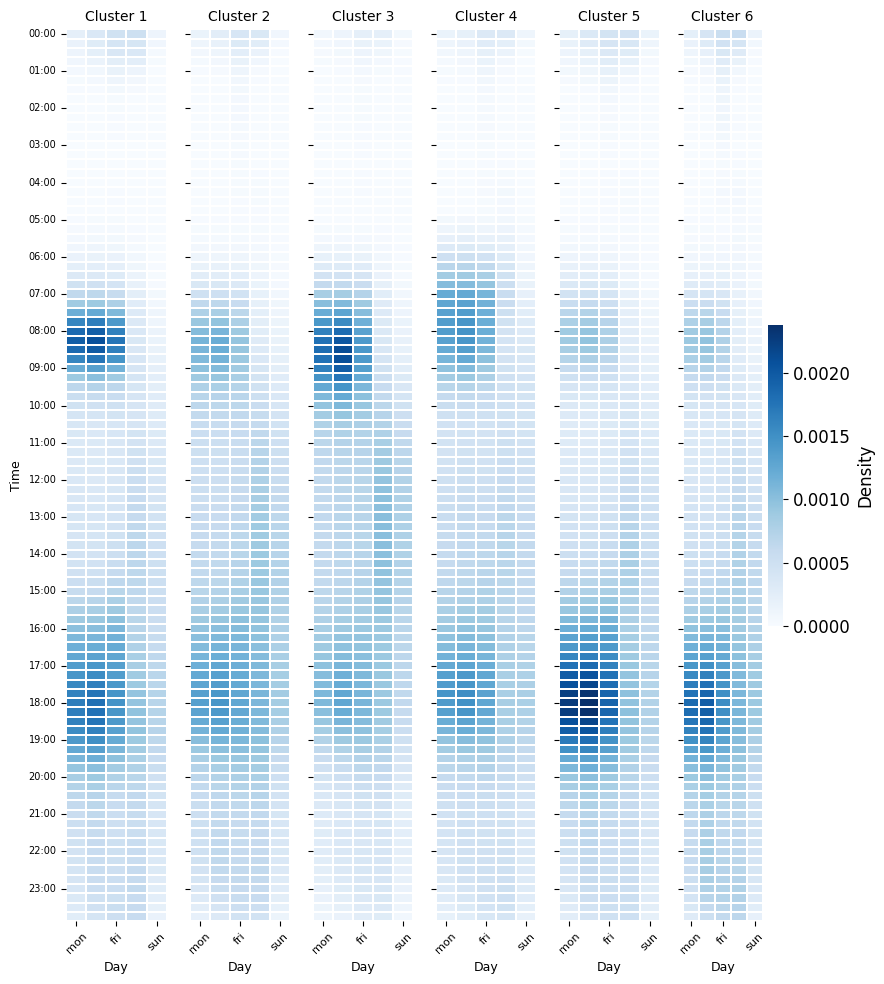

In [ ]:
# 设置 day 顺序
day_list = ['mon', 'twt', 'fri', 'sat', 'sun']

# 提取所有时间起始点
def extract_hour(col):
    time_range = col.split('_')[0]
    return f"{time_range[:2]}:{time_range[2:4]}"

hour_list = sorted(
    {extract_hour(col) for col in exits_profiles.columns[:-1]},
    key=lambda x: int(x[:2]) * 60 + int(x[3:])
)

# 设置每小时显示一次时间刻度
hour_ticks = [h for h in hour_list if h.endswith(":00")]

# 准备子图画布（横向排列多个竖长热力图）
n_clusters = exits_profiles.shape[0]
fig, axes = plt.subplots(
    nrows=1,
    ncols=n_clusters,
    figsize=(1.25 * n_clusters, 10),  # 更紧凑的宽度
    sharey=True
)

if n_clusters == 1:
    axes = [axes]

# 收集所有热力图数据（为了统一 colorbar）
heatmaps = []

for i, (cluster_id, row) in enumerate(exits_profiles.iterrows()):
    heatmap_data = pd.DataFrame(0.0, index=day_list, columns=hour_list)
    for col in row.index:
        parts = col.split('_')
        if len(parts) != 3:
            continue
        time_range, day, action = parts
        hour_start = f"{time_range[:2]}:{time_range[2:4]}"
        if day in day_list and hour_start in hour_list:
            heatmap_data.loc[day, hour_start] += row[col]

    heatmap_data = heatmap_data.T
    heatmaps.append(heatmap_data)

# 统一色阶范围
vmin = 0
vmax = max(h.max().max() for h in heatmaps)

# 画图
for i, heatmap_data in enumerate(heatmaps):
    ax = axes[i]
    sns.heatmap(
        heatmap_data,
        cmap='Blues',
        linewidths=0.1,
        linecolor='white',
        vmin=vmin,
        vmax=vmax,
        square=False,
        ax=ax,
        cbar=(i == n_clusters - 1),
        cbar_kws={
            'shrink': 0.6,
            'label': 'Density',
            'orientation': 'vertical'
        } if i == n_clusters - 1 else None
    )

    ax.set_title(f'Cluster {i+1}', fontsize=10)
    ax.set_xlabel('Day', fontsize=9)
    if i == 0:
        ax.set_ylabel('Time', fontsize=9)
    else:
        ax.set_ylabel('')

    # 设置 x 坐标标签
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=8, rotation=45)

    # 设置 y 坐标标签（仅整点显示）
    ax.set_yticks([hour_list.index(h) + 0.5 for h in hour_ticks])
    ax.set_yticklabels(hour_ticks, fontsize=7)

plt.tight_layout()
plt.show()

C:\Users\22499\AppData\Local\Temp\ipykernel_41948\1768959434.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.91, 1])  # 为右侧色条留空间


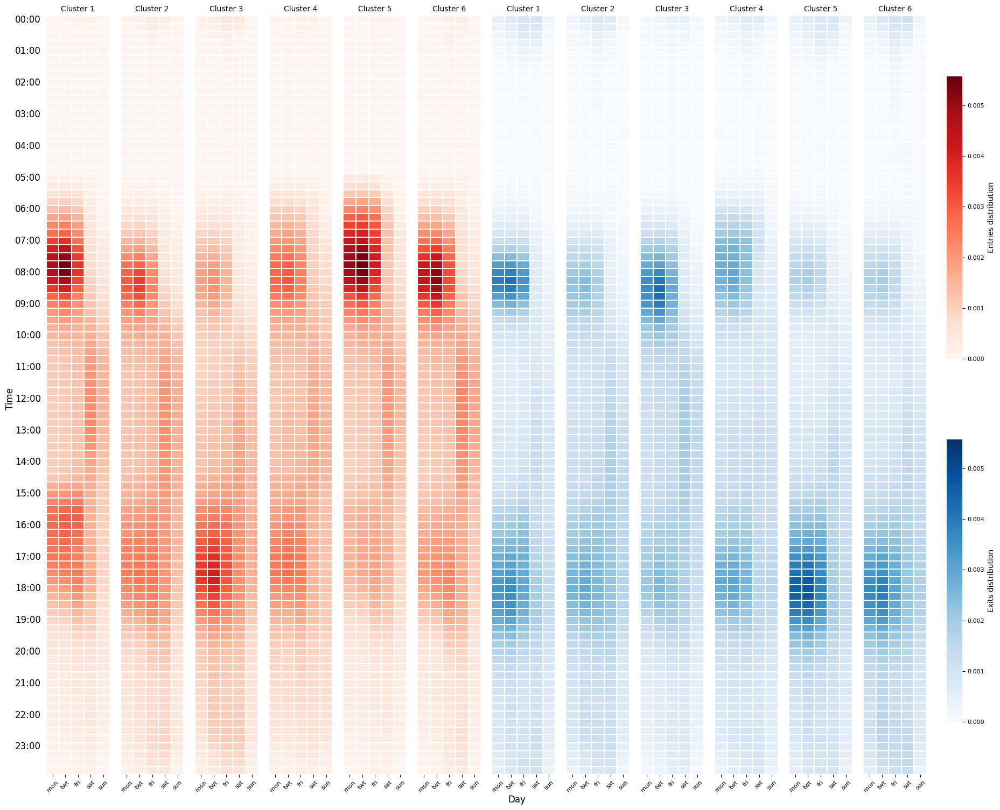

In [126]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ---------------------
# 设置 day 和 hour
day_list = ['mon', 'twt', 'fri', 'sat', 'sun']

def extract_hour(col):
    time_range = col.split('_')[0]
    return f"{time_range[:2]}:{time_range[2:4]}"

hour_list = sorted(
    {extract_hour(col) for col in entries_profiles.columns[:-1]},
    key=lambda x: int(x[:2]) * 60 + int(x[3:])
)
hour_ticks = [h for h in hour_list if h.endswith(":00")]

# ---------------------
# 提取 heatmap 数据函数
def get_heatmaps(profiles):
    heatmaps = []
    for _, row in profiles.iterrows():
        heatmap_data = pd.DataFrame(0.0, index=day_list, columns=hour_list)
        for col in row.index:
            parts = col.split('_')
            if len(parts) != 3:
                continue
            time_range, day, action = parts
            hour_start = f"{time_range[:2]}:{time_range[2:4]}"
            if day in day_list and hour_start in hour_list:
                heatmap_data.loc[day, hour_start] += row[col]
        heatmap_data = heatmap_data.T  # 时间 × 星期
        heatmaps.append(heatmap_data)
    return heatmaps

entries_heatmaps = get_heatmaps(entries_profiles)
exits_heatmaps = get_heatmaps(exits_profiles)
n_clusters = len(entries_heatmaps)

# 色阶统一
vmin = 0
vmax = max(
    max(h.max().max() for h in entries_heatmaps),
    max(h.max().max() for h in exits_heatmaps)
)

# ---------------------
# 设置画布：一行 2×n_clusters 个热力图
fig_width = 2 * n_clusters * 1.5 + 1.0  # 多留空间给 colorbar
fig, axes = plt.subplots(
    nrows=1,
    ncols=2 * n_clusters,
    figsize=(fig_width, 15),
    sharey=True
)

axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]
heatmap_images = []

# 绘制 entries
for i in range(n_clusters):
    ax = axes[i]
    im = sns.heatmap(
        entries_heatmaps[i],
        cmap='Reds',
        linewidths=0.1,
        linecolor='white',
        vmin=vmin,
        vmax=vmax,
        square=False,
        ax=ax,
        cbar=False
    )
    heatmap_images.append(im)

    ax.set_title(f'Cluster {i+1}', fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=8, rotation=45)
    ax.set_yticks([])
    ax.set_yticklabels([])
    ax.set_ylabel('')
    ax.tick_params(left=False)

# 绘制 exits
for i in range(n_clusters):
    ax = axes[i + n_clusters]
    im = sns.heatmap(
        exits_heatmaps[i],
        cmap='Blues',
        linewidths=0.1,
        linecolor='white',
        vmin=vmin,
        vmax=vmax,
        square=False,
        ax=ax,
        cbar=False
    )
    heatmap_images.append(im)

    ax.set_title(f'Cluster {i+1}', fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=8, rotation=45)
    ax.set_yticks([])
    ax.set_yticklabels([])
    ax.set_ylabel('')
    ax.tick_params(left=False)

# 添加唯一 colorbar
# 添加 Entries colorbar（左边）
cbar_ax_entries = fig.add_axes([0.92, 0.55, 0.015, 0.35])  # [left, bottom, width, height]
cbar_entries = fig.colorbar(heatmap_images[0].collections[0], cax=cbar_ax_entries)
cbar_entries.set_label("Entries distribution", fontsize=10)
cbar_entries.ax.tick_params(labelsize=8)
cbar_entries.outline.set_visible(False)  # 去除黑框

# 添加 Exits colorbar（右边）
cbar_ax_exits = fig.add_axes([0.92, 0.10, 0.015, 0.35])
cbar_exits = fig.colorbar(heatmap_images[-1].collections[0], cax=cbar_ax_exits)
cbar_exits.set_label("Exits distribution", fontsize=10)
cbar_exits.ax.tick_params(labelsize=8)
cbar_exits.outline.set_visible(False)

# 设置时间坐标只出现在最后一个子图
last_ax = axes[-1]
last_ax.set_yticks([hour_list.index(h) + 0.5 for h in hour_ticks])
last_ax.set_yticklabels(hour_ticks, fontsize=8)
last_ax.tick_params(left=False)
# 添加整体 Y 轴标签（左侧）
fig.text(0.00, 0.5, 'Time', va='center', rotation='vertical', fontsize=12)

# 添加整体 X 轴标签（下方）
fig.text(0.5, 0.00, 'Day', ha='center', fontsize=12)

# ---------------------
plt.tight_layout(rect=[0, 0, 0.91, 1])  # 为右侧色条留空间
plt.show()
